In [26]:
import itertools
from cwgp.grid_search import grid_search
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import copy
import GPy
from sklearn.metrics import mean_absolute_error, mean_squared_error
import os
import scipy
from sklearn.model_selection import KFold


In [4]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
def exp(x, *par):
    return par[0]*np.exp(par[1]*x)

In [6]:
def norm(x, *par):
    return par[0]*np.exp(par[1]*x**2)

In [7]:
def poly(x, *par):
    return np.polyval(par,x)

In [8]:
def log(x, *par):
    return par[0]*np.log(x)

In [9]:
def const(x, *par):
    return 0

In [10]:
def recip(x, *par):
    return 1/(par[0]*x**2+1)

In [11]:
def cwgp_regression(x_train, y_train, cwgp_model, **kwargs):
    kernel = GPy.kern.RBF(1)


    res = scipy.optimize.curve_fit(kwargs["func"],  np.ravel(x_train), np.ravel(y_train), p0=kwargs["init_params"], maxfev=3000)
    par = res[0]
    print(f"params:{par}")
    mf = GPy.core.Mapping(1,1)
    mf.f = lambda x: kwargs["func"](x, *par)
    mf.update_gradients = lambda a,b: None


    model = GPy.models.GPRegression(x_train, y_train, mean_function=mf, kernel=kernel)
    model.optimize()

    
    start, end = 1940, 2031
    domain_discrete = np.arange(start, end).reshape(-1,1)
    domain = np.linspace(start,end,end-start)
    y_all = model.predict(domain_discrete)
    y_mean,y_var = y_all[0],y_all[1]
    y_top, y_bot = y_mean + 1.96*np.sqrt(y_var), y_mean - 1.96*np.sqrt(y_var)

    cwgp_y_val = y_val
    cwgp_y_test = y_test
    
    for cwgp in cwgp_model:
        cwgp_y_val, d = cwgp.phi.comp_phi(cwgp.phi.res.x, cwgp_y_val)
        cwgp_y_test, d = cwgp.phi.comp_phi(cwgp.phi.res.x, cwgp_y_test)
    
    plt.fill_between(domain, np.ravel(y_top), np.ravel(y_bot), color=(0,0.5,0.5,0.2), label="Confidence")
    plt.scatter(x_train,y_train, marker="x", color='black', label="data")
    plt.scatter(x_val,cwgp_y_val, marker="x", color='red', label="validate")
    plt.scatter(x_test, cwgp_y_test, marker="x", color='blue', label="test")
    plt.plot(np.linspace(start,end,end-start),y_mean, label="mean")
    plt.grid(True)
    plt.legend()
    plt.show() 
    
    for cwgp in cwgp_model[::-1]:
        y_train = cwgp.phi.inv_comp_phi(cwgp.phi.res.x, y_train)
        y_mean, y_var = cwgp.phi.inv_comp_phi(cwgp.phi.res.x, y_mean), cwgp.phi.inv_comp_phi(cwgp.phi.res.x, y_var)
        y_top, y_bot = cwgp.phi.inv_comp_phi(cwgp.phi.res.x, y_top), cwgp.phi.inv_comp_phi(cwgp.phi.res.x, y_bot)


    validate_rmse = mean_squared_error(y_val, y_mean[train_up+start_align:train_up+start_align+validate], squared=False)
    validate_mae = mean_absolute_error(y_val, y_mean[train_up+start_align:train_up+start_align+validate])
    test_rmse = mean_squared_error(y_test, y_mean[train_up+start_align+validate:train_up+start_align+validate+test], squared=False)
    test_mae = mean_absolute_error(y_test, y_mean[train_up+start_align+validate:train_up+start_align+validate+test])
    txt = f"""validate rmse : {validate_rmse} \n validate mae : {validate_mae} \n
    test rmse : {test_rmse} \n test mae : {test_mae}"""

    
    name = [f"{cwgp.phi.fn.__name__}_{cwgp.phi.n}" for cwgp in cwgp_model]
    name = "_".join(name)
    plt.fill_between(domain, np.ravel(y_top), np.ravel(y_bot), color=(0,0.5,0.5,0.2), label="Confidence")
    plt.scatter(x_train,y_train, marker="x", color='black', label="data")
    plt.scatter(x_val,y_val, marker="x", color='red', label="validate")
    plt.scatter(x_test, y_test, marker="x", color='blue', label="test")
    plt.plot(np.linspace(start,end,end-start),y_mean, label="mean")
    plt.ylim([0.1,0.35])
    plt.legend()
    plt.figtext(0.5, 0.2, txt, wrap=True, horizontalalignment='center', fontsize=12)
    plt.grid(True)
    plt.show()



    print(txt)
    return txt

In [12]:
def gp_regression(x_train, y_train, mean_func, init_param, **kwargs):
    kernel = GPy.kern.RBF(1)


    res = scipy.optimize.curve_fit(mean_func,  np.ravel(x_train), np.ravel(y_train), p0=init_param,  maxfev=3000)
    par = res[0]
    print(f"params:{par}")
    mf = GPy.core.Mapping(1,1)
    mf.f = lambda x: mean_func(x, *par)
    mf.update_gradients = lambda a,b: None

    model = GPy.models.GPRegression(x_train, y_train, mean_function=mf, kernel=kernel)
    model.optimize()

    
    start, end = 1940, 2031
    start_align = np.min(x_train)-start
    domain_discrete = np.arange(start, end).reshape(-1,1)
    y_all = model.predict(domain_discrete)
    y_mean,y_var = y_all[0],y_all[1]

    validate_rmse = mean_squared_error(y_val, y_mean[train_up+start_align:train_up+start_align+validate], squared=False)
    validate_mae = mean_absolute_error(y_val, y_mean[train_up+start_align:train_up+start_align+validate])
    test_rmse = mean_squared_error(y_test, y_mean[train_up+start_align+validate:train_up+start_align+validate+test], squared=False)
    test_mae = mean_absolute_error(y_test, y_mean[train_up+start_align+validate:train_up+start_align+validate+test])
    txt = f"""validate rmse : {validate_rmse} \n validate mae : {validate_mae} \n
    test rmse : {test_rmse} \n test mae : {test_mae}"""


    model.plot(plot_limits=[start, end])

    plt.title('Age ' + str(age) + f" {mean_func.__name__}")
    plt.xlabel('Year')
    plt.ylabel('Mortality Rate' )
    plt.scatter(x_train,y_train, marker="x", color='black', label="data")
    plt.scatter(x_val,y_val, marker="x", color='red', label="validate")
    plt.scatter(x_test, y_test, marker="x", color='blue', label="test")
    plt.figtext(0.5, 0.2, txt, wrap=True, horizontalalignment='center', fontsize=12)
    plt.ylim([0.1,0.35])

    plt.grid(True)
#     plt.savefig(f'./{IMG_DIR}/{mean_func.__name__}_{age}_mf.png')
    plt.show()
    
    return par

In [13]:
CSV_FIlE = "../japan.csv"
df = pd.read_csv(CSV_FIlE)
age = 90
df_all = {}
df_all[age]= df[(df["age"]==age)]

year = df_all[age]["year"].to_numpy().reshape(-1,1)
rate = df_all[age]["total"].to_numpy().reshape(-1,1)


In [21]:
test_ratio = 1 - 0.2
length = len(rate)

test = int(test_ratio*length)

x_tv, y_tv = year[:test], rate[:test]
x_test, y_test = year[test:], rate[test:]

In [29]:
def cv(x_tv, y_tv, cwgp_model, n_splits=10, **kwargs):
    kf = KFold(n_splits=n_splits, random_state=None, shuffle=False)

    for train, val in kf.split(x_tv):
        x_train, x_val = x_tv[train], x_tv[val]
        y_train, y_val = y_tv[train], y_tv[val]
        print(train, val)

SyntaxError: invalid syntax (<ipython-input-29-a5f46b810d57>, line 1)

In [ ]:
        cwgp_regression(x_train, y_train, cwgp_model
                    x_val=x_val,y_val=y_val,
                    **kwargs
                       )

  0%|          | 0/1296 [00:00<?, ?it/s]

[('sa', 1), ('sa', 2), ('sal', 1), ('sal', 2), ('box_cox', 1), ('box_cox', 2)]
(('sa', 1), ('sa', 1), ('sa', 1), ('sa', 1))
params:[-7.76175693e-02  1.53320769e+02]


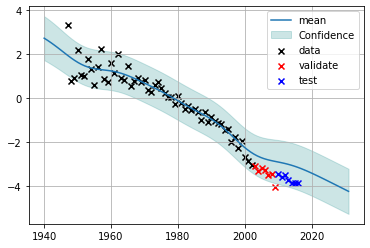

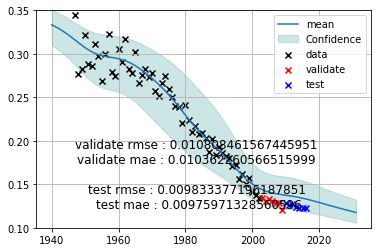

  0%|          | 1/1296 [00:00<17:27,  1.24it/s]

validate rmse : 0.010808461567445951 
 validate mae : 0.010362260566515999 

    test rmse : 0.009833377196187851 
 test mae : 0.00975971328560596
(('sa', 1), ('sa', 1), ('sa', 1), ('sa', 2))
params:[-7.76175744e-02  1.53320778e+02]


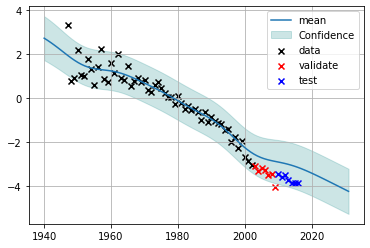

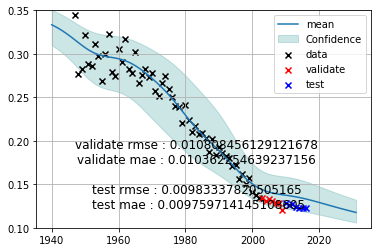

  0%|          | 2/1296 [00:01<18:49,  1.15it/s]

validate rmse : 0.010808456129121678 
 validate mae : 0.010362254639237156 

    test rmse : 0.00983337820505165 
 test mae : 0.009759714145108605
(('sa', 1), ('sa', 1), ('sa', 1), ('sal', 1))
params:[-1.03827103e-01  2.05058909e+02]


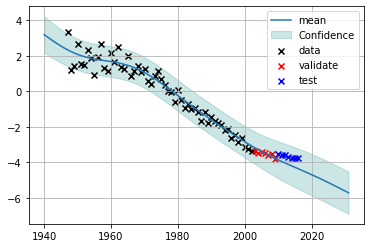

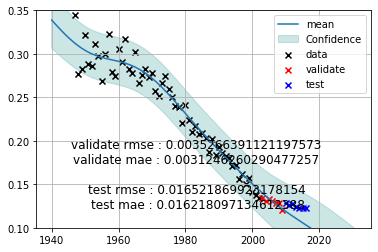

  0%|          | 3/1296 [00:04<35:00,  1.62s/it]

validate rmse : 0.0035266391121197573 
 validate mae : 0.0031246260290477257 

    test rmse : 0.016521869923178154 
 test mae : 0.016218097134612388
(('sa', 1), ('sa', 1), ('sa', 1), ('sal', 2))
params:[-1.10279191e-01  2.17741730e+02]


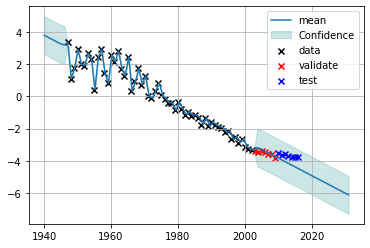

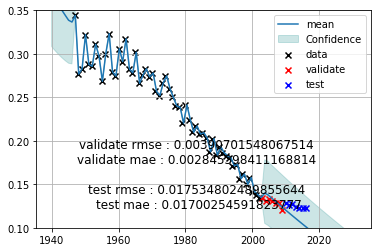

  0%|          | 4/1296 [00:07<50:48,  2.36s/it]

validate rmse : 0.00390701548067514 
 validate mae : 0.002845398411168814 

    test rmse : 0.017534802489855644 
 test mae : 0.01700254591823777
(('sa', 1), ('sa', 1), ('sa', 1), ('box_cox', 1))
params:[-8.17929340e-02  1.60473263e+02]


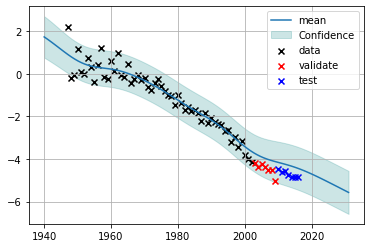

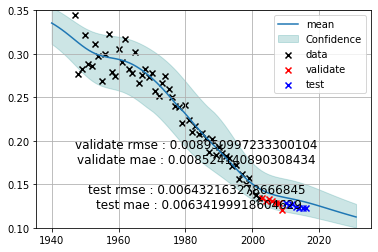

  0%|          | 5/1296 [00:08<37:38,  1.75s/it]

validate rmse : 0.008950997233300104 
 validate mae : 0.008524140890308434 

    test rmse : 0.006432163278666845 
 test mae : 0.00634199918604629
(('sa', 1), ('sa', 1), ('sa', 1), ('box_cox', 2))
params:[-8.01066638e-02  1.55903228e+02]


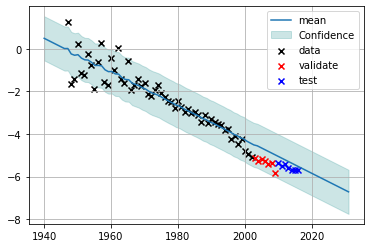

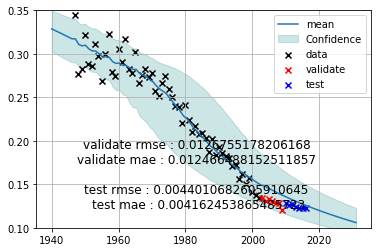

  0%|          | 6/1296 [00:09<30:19,  1.41s/it]

validate rmse : 0.0126755178206168 
 validate mae : 0.012466488152511857 

    test rmse : 0.0044010682605910645 
 test mae : 0.004162453865485723
(('sa', 1), ('sa', 1), ('sa', 2), ('sa', 1))
params:[-7.76175675e-02  1.53320766e+02]


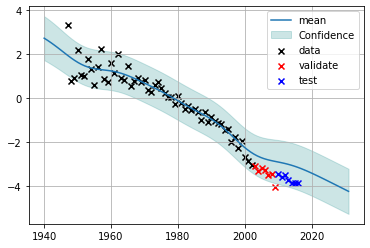

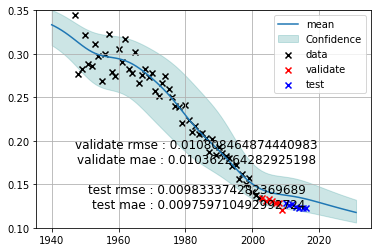

  1%|          | 7/1296 [00:10<26:39,  1.24s/it]

validate rmse : 0.010808464874440983 
 validate mae : 0.010362264282925198 

    test rmse : 0.009833374282369689 
 test mae : 0.009759710492992724
(('sa', 1), ('sa', 1), ('sa', 2), ('sa', 2))
params:[-7.76175727e-02  1.53320776e+02]


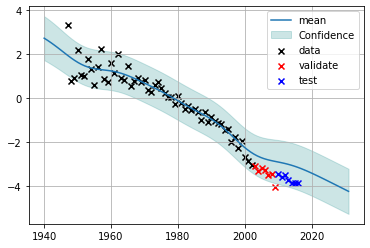

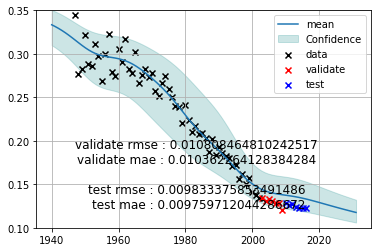

  1%|          | 8/1296 [00:11<24:41,  1.15s/it]

validate rmse : 0.010808464810242517 
 validate mae : 0.010362264128384284 

    test rmse : 0.009833375853491486 
 test mae : 0.009759712044286672
(('sa', 1), ('sa', 1), ('sa', 2), ('sal', 1))
params:[-1.03604147e-01  2.04564130e+02]


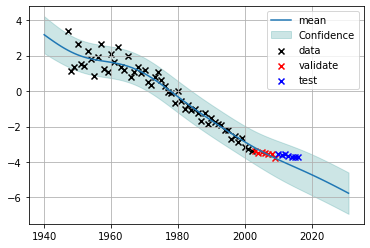

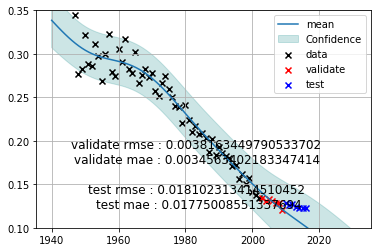

  1%|          | 9/1296 [00:12<28:30,  1.33s/it]

validate rmse : 0.0038163449790533702 
 validate mae : 0.0034563402183347414 

    test rmse : 0.018102313414510452 
 test mae : 0.01775008551337694
(('sa', 1), ('sa', 1), ('sa', 2), ('sal', 2))
params:[-1.10119717e-01  2.17426095e+02]


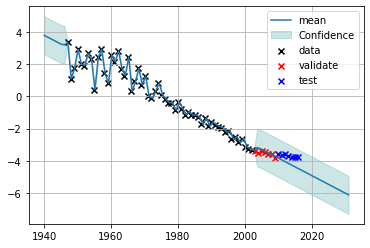

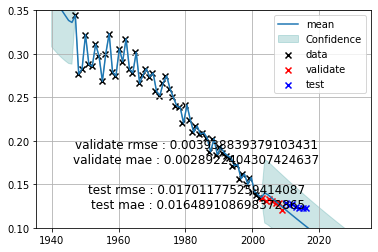

  1%|          | 10/1296 [00:18<56:55,  2.66s/it]

validate rmse : 0.003938839379103431 
 validate mae : 0.0028922404307424637 

    test rmse : 0.017011775259414087 
 test mae : 0.016489108698372865
(('sa', 1), ('sa', 1), ('sa', 2), ('box_cox', 1))
params:[-8.17929017e-02  1.60473199e+02]


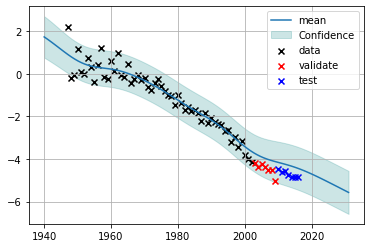

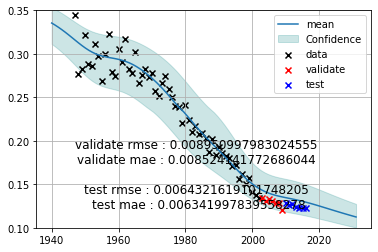

  1%|          | 11/1296 [00:19<44:41,  2.09s/it]

validate rmse : 0.008950997983024555 
 validate mae : 0.008524141772686044 

    test rmse : 0.0064321619101748205 
 test mae : 0.006341997839558278
(('sa', 1), ('sa', 1), ('sa', 2), ('box_cox', 2))
params:[-8.01068205e-02  1.55903528e+02]


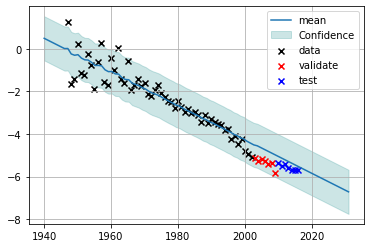

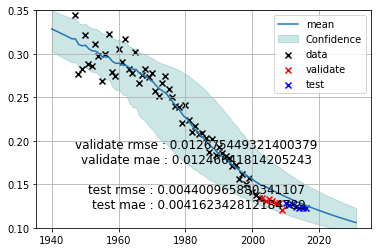

  1%|          | 12/1296 [00:20<36:39,  1.71s/it]

validate rmse : 0.012675449321400379 
 validate mae : 0.01246641814205243 

    test rmse : 0.004400965880341107 
 test mae : 0.004162342812184789
(('sa', 1), ('sa', 1), ('sal', 1), ('sa', 1))
params:[-1.02753093e-01  2.02968883e+02]


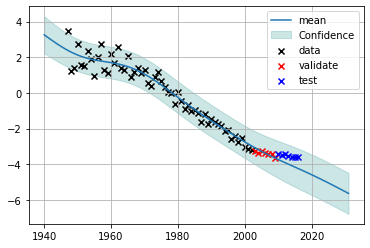

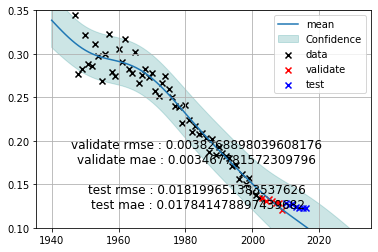

  1%|          | 13/1296 [00:22<43:33,  2.04s/it]

validate rmse : 0.0038268898039608176 
 validate mae : 0.003467781572309796 

    test rmse : 0.018199651383537626 
 test mae : 0.017841478897439682
(('sa', 1), ('sa', 1), ('sal', 1), ('sa', 2))
params:[-1.02926088e-01  2.03341917e+02]


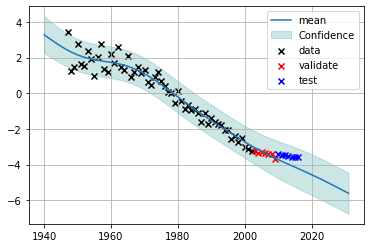

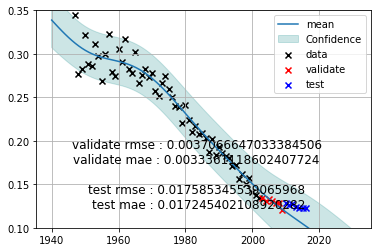

  1%|          | 14/1296 [00:24<43:06,  2.02s/it]

validate rmse : 0.0037066647033384506 
 validate mae : 0.0033361118602407724 

    test rmse : 0.017585345539065968 
 test mae : 0.017245402108920282
(('sa', 1), ('sa', 1), ('sal', 1), ('sal', 1))
params:[-1.07054566e-01  2.11251396e+02]


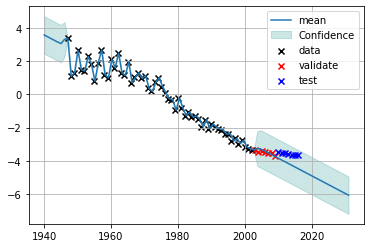

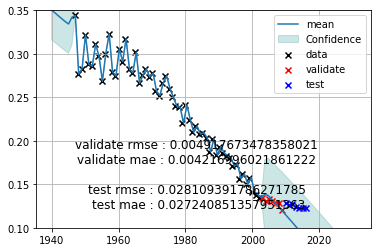

  1%|          | 15/1296 [00:26<41:28,  1.94s/it]

validate rmse : 0.004917673478358021 
 validate mae : 0.004216996021861222 

    test rmse : 0.028109391786271785 
 test mae : 0.027240851357951363
(('sa', 1), ('sa', 1), ('sal', 1), ('sal', 2))
params:[-1.11720860e-01  2.20575486e+02]


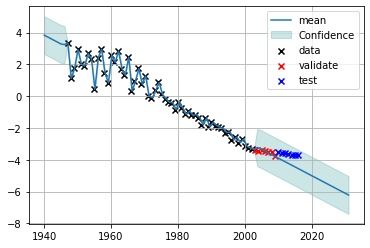

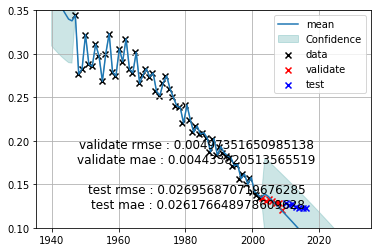

  1%|          | 16/1296 [00:31<58:30,  2.74s/it]

validate rmse : 0.00497351650985138 
 validate mae : 0.004433820513565519 

    test rmse : 0.026956870719676285 
 test mae : 0.026176648978609628
(('sa', 1), ('sa', 1), ('sal', 1), ('box_cox', 1))
params:[-1.02491230e-01  2.01469333e+02]


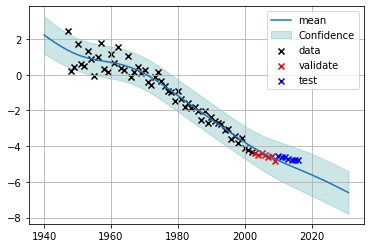

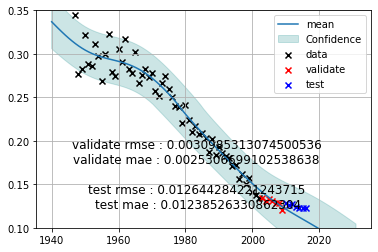

  1%|▏         | 17/1296 [00:32<51:35,  2.42s/it]

validate rmse : 0.0030985313074500536 
 validate mae : 0.0025306699102538638 

    test rmse : 0.012644284221243715 
 test mae : 0.01238526330862304
(('sa', 1), ('sa', 1), ('sal', 1), ('box_cox', 2))
params:[-1.04533875e-01  2.04383411e+02]


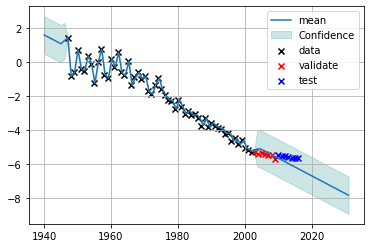

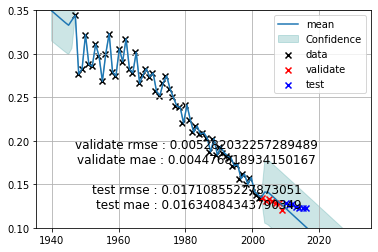

  1%|▏         | 18/1296 [00:34<49:44,  2.34s/it]

validate rmse : 0.005282032257289489 
 validate mae : 0.004476818934150167 

    test rmse : 0.01710855227873051 
 test mae : 0.01634084343790349
(('sa', 1), ('sa', 1), ('sal', 2), ('sa', 1))
params:[-1.10359604e-01  2.17901127e+02]


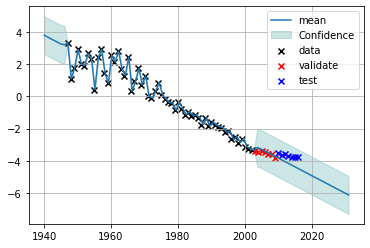

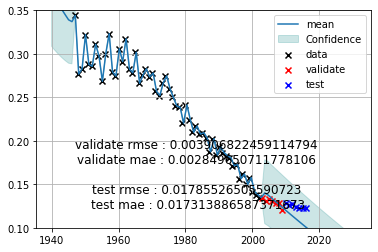

  1%|▏         | 19/1296 [00:45<1:42:19,  4.81s/it]

validate rmse : 0.003906822459114794 
 validate mae : 0.002849650711778106 

    test rmse : 0.01785526505590723 
 test mae : 0.017313886587371673
(('sa', 1), ('sa', 1), ('sal', 2), ('sa', 2))
params:[-1.10294481e-01  2.17769618e+02]


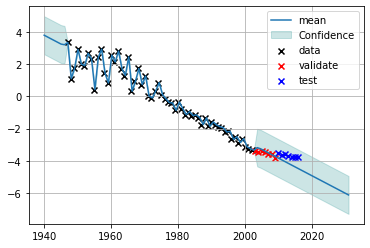

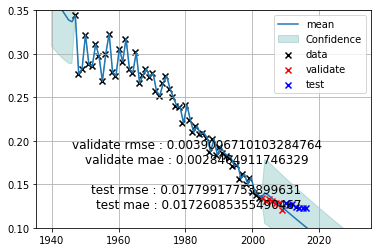

  2%|▏         | 20/1296 [00:58<2:31:39,  7.13s/it]

validate rmse : 0.0039006710103284764 
 validate mae : 0.0028464911746329 

    test rmse : 0.01779917753899631 
 test mae : 0.01726085355490467
(('sa', 1), ('sa', 1), ('sal', 2), ('sal', 1))
params:[-1.10948150e-01  2.19071603e+02]


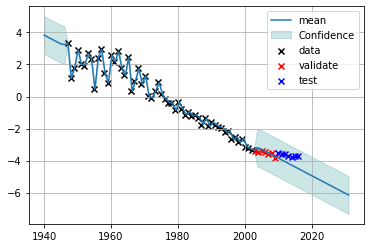

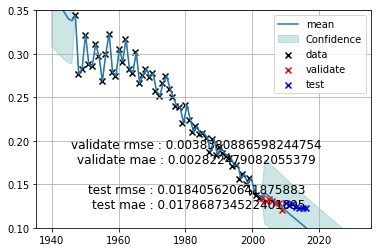

  2%|▏         | 21/1296 [01:03<2:19:09,  6.55s/it]

validate rmse : 0.0038380886598244754 
 validate mae : 0.002822479082055379 

    test rmse : 0.018405620641875883 
 test mae : 0.017868734522401095
(('sa', 1), ('sa', 1), ('sal', 2), ('sal', 2))
params:[-1.11307446e-01  2.19776171e+02]


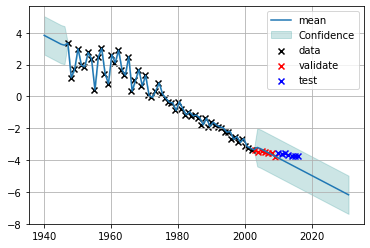

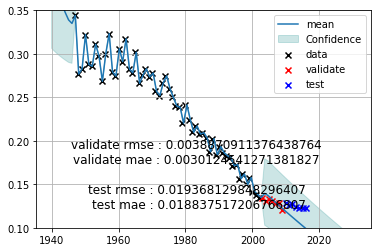

  2%|▏         | 22/1296 [01:36<5:06:08, 14.42s/it]

validate rmse : 0.0038870911376438764 
 validate mae : 0.0030124541271381827 

    test rmse : 0.019368129848296407 
 test mae : 0.018837517206766807
(('sa', 1), ('sa', 1), ('sal', 2), ('box_cox', 1))
params:[-3.21031431e-03  9.87698645e+00]


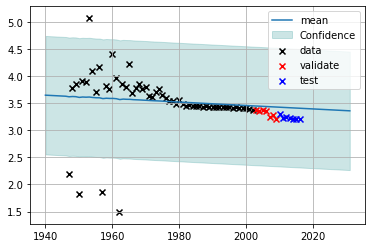

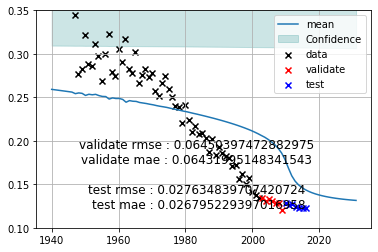

  2%|▏         | 23/1296 [01:39<3:54:08, 11.04s/it]

validate rmse : 0.06450397472882975 
 validate mae : 0.06431995148341543 

    test rmse : 0.027634839707420724 
 test mae : 0.026795229397016958
(('sa', 1), ('sa', 1), ('sal', 2), ('box_cox', 2))
params:[-1.08069899e-01  2.11446896e+02]


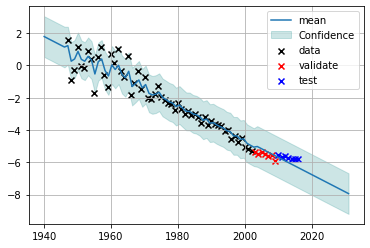

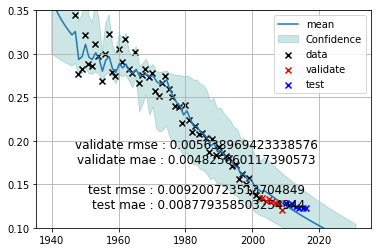

  2%|▏         | 24/1296 [02:11<6:07:00, 17.31s/it]

validate rmse : 0.005638969423338576 
 validate mae : 0.004825660117390573 

    test rmse : 0.009200723513704849 
 test mae : 0.008779358503254944
(('sa', 1), ('sa', 1), ('box_cox', 1), ('sa', 1))
params:[-7.69094690e-02  1.51138784e+02]


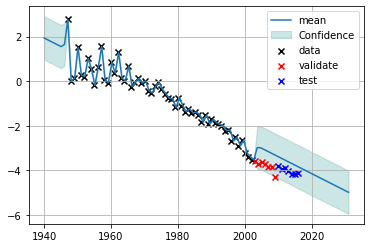

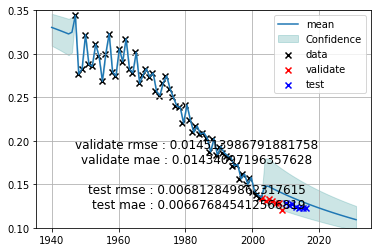

  2%|▏         | 25/1296 [02:12<4:22:43, 12.40s/it]

validate rmse : 0.014513986791881758 
 validate mae : 0.01434097196357628 

    test rmse : 0.006812849862317615 
 test mae : 0.006676845412566819
(('sa', 1), ('sa', 1), ('box_cox', 1), ('sa', 2))
params:[-7.69094509e-02  1.51138749e+02]


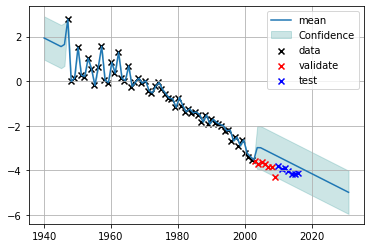

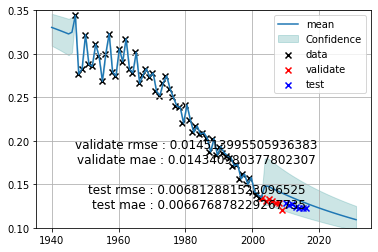

  2%|▏         | 26/1296 [02:13<3:10:28,  9.00s/it]

validate rmse : 0.014513995505936383 
 validate mae : 0.014340980377802307 

    test rmse : 0.006812881523096525 
 test mae : 0.006676878229267735
(('sa', 1), ('sa', 1), ('box_cox', 1), ('sal', 1))
params:[-1.04265636e-01  2.05917260e+02]


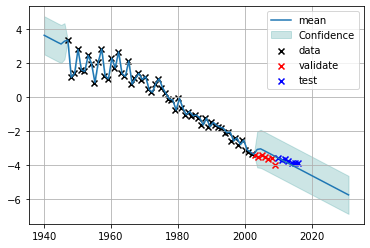

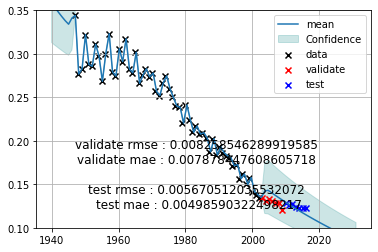

  2%|▏         | 27/1296 [02:18<2:46:54,  7.89s/it]

validate rmse : 0.008258546289919585 
 validate mae : 0.007878447608605718 

    test rmse : 0.005670512035532072 
 test mae : 0.00498590322498217
(('sa', 1), ('sa', 1), ('box_cox', 1), ('sal', 2))
params:[-3.49940767e-01  6.78129847e+02]


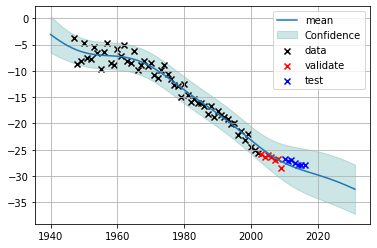

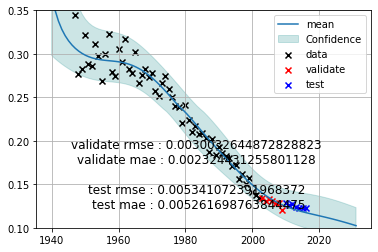

  2%|▏         | 28/1296 [02:24<2:34:37,  7.32s/it]

validate rmse : 0.0030032644872828823 
 validate mae : 0.002324431255801128 

    test rmse : 0.005341072391968372 
 test mae : 0.005261698763844475
(('sa', 1), ('sa', 1), ('box_cox', 1), ('box_cox', 1))
params:[-8.40446133e-02  1.63599977e+02]


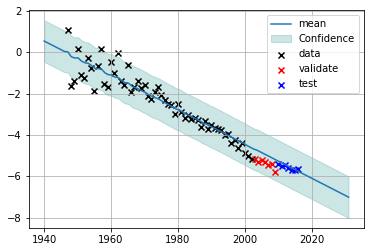

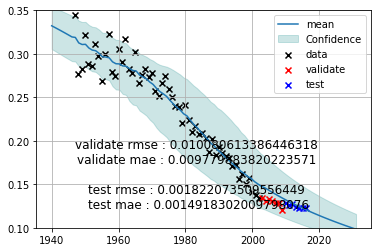

  2%|▏         | 29/1296 [02:25<1:52:58,  5.35s/it]

validate rmse : 0.010080613386446318 
 validate mae : 0.009779883820223571 

    test rmse : 0.001822073509556449 
 test mae : 0.0014918302009798076
(('sa', 1), ('sa', 1), ('box_cox', 1), ('box_cox', 2))
params:[-7.85089626e-02  1.51640514e+02]


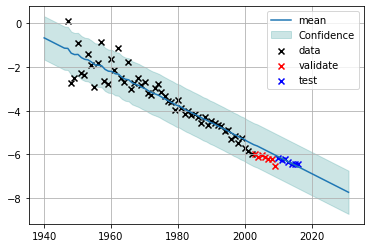

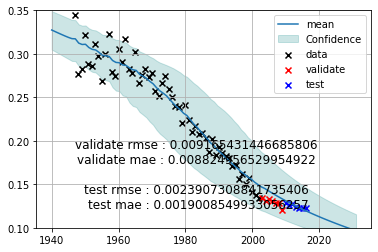

  2%|▏         | 30/1296 [02:25<1:23:43,  3.97s/it]

validate rmse : 0.009165431446685806 
 validate mae : 0.008824956529954922 

    test rmse : 0.0023907308841735406 
 test mae : 0.0019008549933056257
(('sa', 1), ('sa', 1), ('box_cox', 2), ('sa', 1))
params:[-7.04458648e-02  1.37511467e+02]


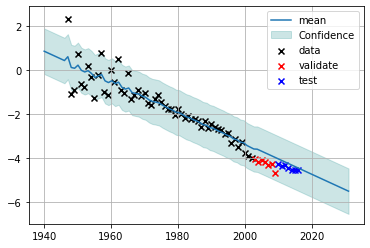

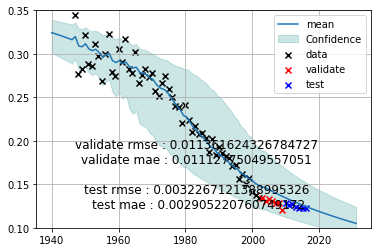

  2%|▏         | 31/1296 [02:26<1:04:05,  3.04s/it]

validate rmse : 0.011361624326784727 
 validate mae : 0.01112775049557051 

    test rmse : 0.0032267121388995326 
 test mae : 0.002905220760749172
(('sa', 1), ('sa', 1), ('box_cox', 2), ('sa', 2))
params:[-7.04453253e-02  1.37510410e+02]


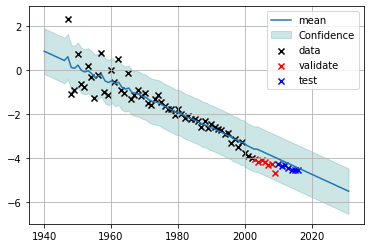

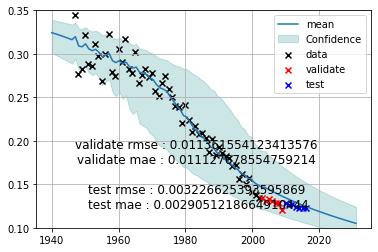

  2%|▏         | 32/1296 [02:27<50:31,  2.40s/it]  

validate rmse : 0.011361554123413576 
 validate mae : 0.011127678554759214 

    test rmse : 0.003226625393595869 
 test mae : 0.0029051218664910444
(('sa', 1), ('sa', 1), ('box_cox', 2), ('sal', 1))
params:[-9.68241327e-02  1.91330061e+02]


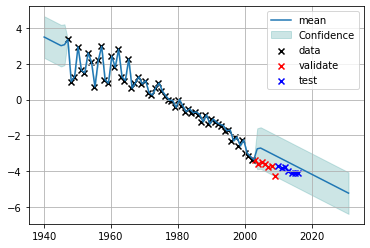

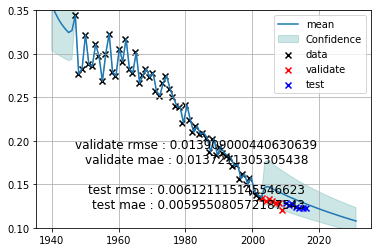

  3%|▎         | 33/1296 [02:29<43:44,  2.08s/it]

validate rmse : 0.013909000440630639 
 validate mae : 0.0137211305305438 

    test rmse : 0.006121115145546623 
 test mae : 0.005955080572187543
(('sa', 1), ('sa', 1), ('box_cox', 2), ('sal', 2))
params:[-1.10013320e-01  2.17257773e+02]


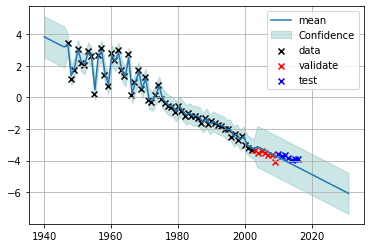

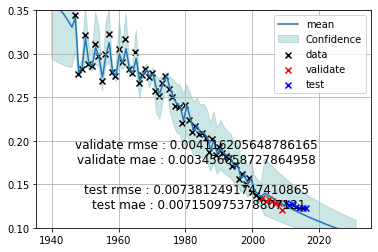

  3%|▎         | 34/1296 [02:34<1:07:51,  3.23s/it]

validate rmse : 0.004116205648786165 
 validate mae : 0.003456658727864958 

    test rmse : 0.0073812491747410865 
 test mae : 0.007150975378807121
(('sa', 1), ('sa', 1), ('box_cox', 2), ('box_cox', 1))
params:[-7.61441063e-02  1.46991583e+02]


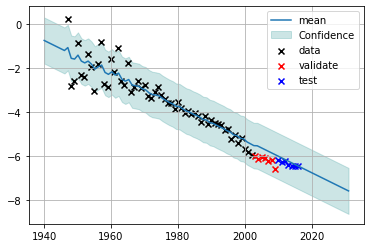

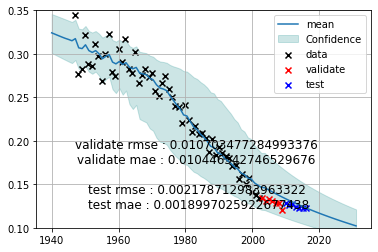

  3%|▎         | 35/1296 [02:35<52:24,  2.49s/it]  

validate rmse : 0.010703477284993376 
 validate mae : 0.010446542746529676 

    test rmse : 0.002178712983963322 
 test mae : 0.0018997025922677438
(('sa', 1), ('sa', 1), ('box_cox', 2), ('box_cox', 2))
params:[-6.74862652e-02  1.28871842e+02]


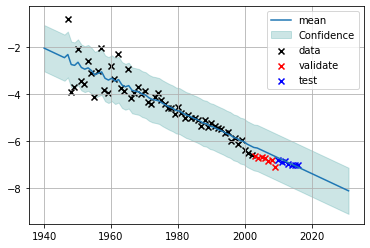

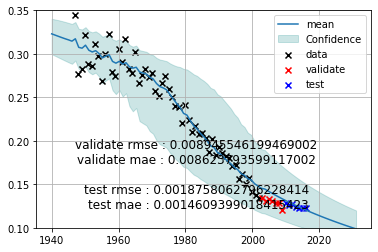

  3%|▎         | 36/1296 [02:36<41:35,  1.98s/it]

validate rmse : 0.008945546199469002 
 validate mae : 0.008623793599117002 

    test rmse : 0.0018758062796228414 
 test mae : 0.0014609399018415423
(('sa', 1), ('sa', 2), ('sa', 1), ('sa', 1))
params:[-7.76175796e-02  1.53320789e+02]


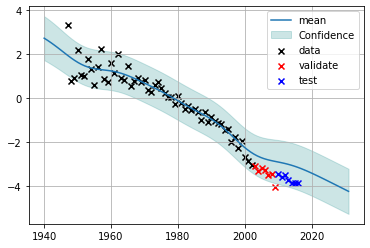

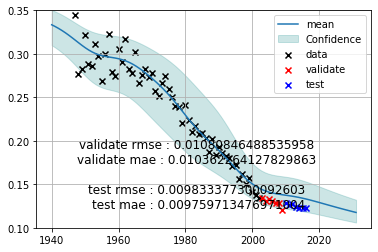

  3%|▎         | 37/1296 [02:37<35:08,  1.67s/it]

validate rmse : 0.01080846488535958 
 validate mae : 0.010362264127829863 

    test rmse : 0.009833377300092603 
 test mae : 0.009759713476971004
(('sa', 1), ('sa', 2), ('sa', 1), ('sa', 2))
params:[-7.76175499e-02  1.53320731e+02]


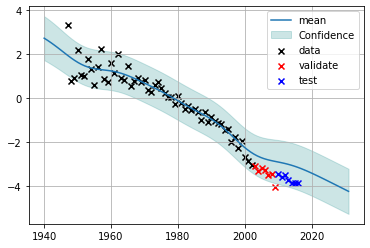

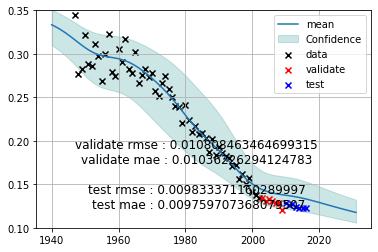

  3%|▎         | 38/1296 [02:38<31:01,  1.48s/it]

validate rmse : 0.010808463464699315 
 validate mae : 0.01036226294124783 

    test rmse : 0.009833371160289997 
 test mae : 0.009759707368079507
(('sa', 1), ('sa', 2), ('sa', 1), ('sal', 1))
params:[-1.03782757e-01  2.04966776e+02]


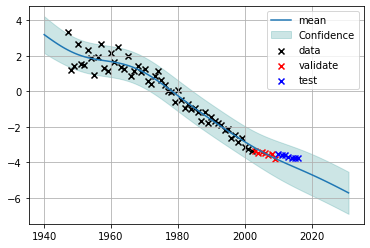

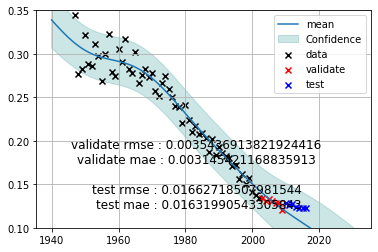

  3%|▎         | 39/1296 [02:40<33:03,  1.58s/it]

validate rmse : 0.0035436913821924416 
 validate mae : 0.003145421168835913 

    test rmse : 0.01662718507981544 
 test mae : 0.01631990543305843
(('sa', 1), ('sa', 2), ('sa', 1), ('sal', 2))
params:[-2.59984136e+05  5.10672834e+08]


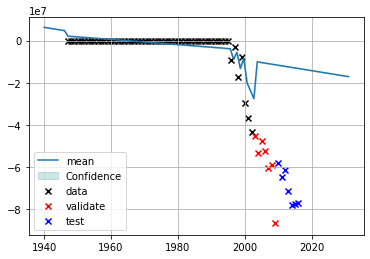

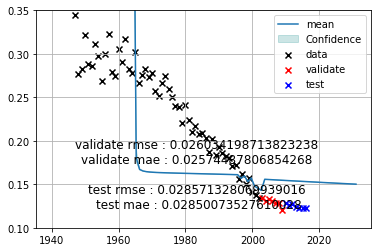

  3%|▎         | 40/1296 [02:47<1:05:56,  3.15s/it]

validate rmse : 0.026034198713823238 
 validate mae : 0.02574487806854268 

    test rmse : 0.028571328069939016 
 test mae : 0.02850073527610028
(('sa', 1), ('sa', 2), ('sa', 1), ('box_cox', 1))
params:[-8.17928841e-02  1.60473165e+02]


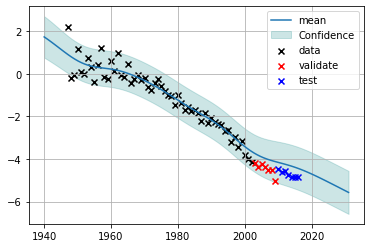

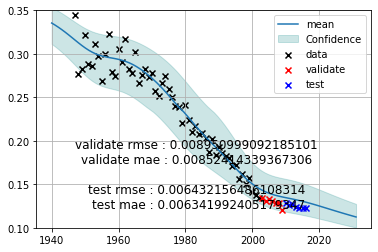

  3%|▎         | 41/1296 [02:47<51:28,  2.46s/it]  

validate rmse : 0.008950999092185101 
 validate mae : 0.00852414339367306 

    test rmse : 0.006432156486108314 
 test mae : 0.006341992405179347
(('sa', 1), ('sa', 2), ('sa', 1), ('box_cox', 2))
params:[-8.01066595e-02  1.55903219e+02]


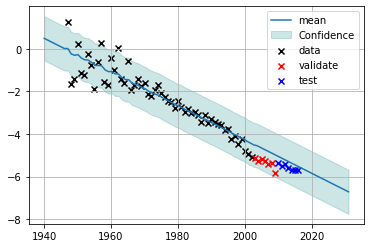

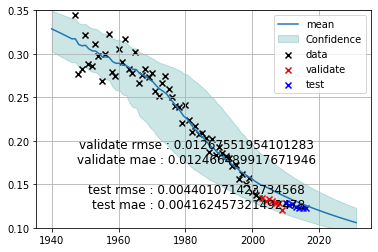

  3%|▎         | 42/1296 [02:48<42:10,  2.02s/it]

validate rmse : 0.01267551954101283 
 validate mae : 0.012466489917671946 

    test rmse : 0.004401071423734568 
 test mae : 0.004162457321492478
(('sa', 1), ('sa', 2), ('sa', 2), ('sa', 1))
params:[-7.76175708e-02  1.53320772e+02]


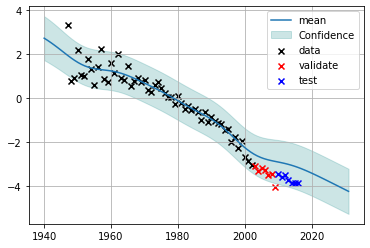

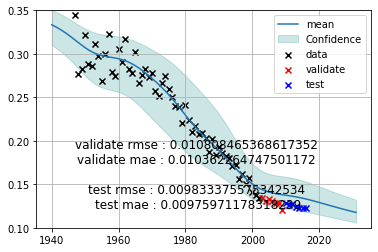

  3%|▎         | 43/1296 [02:49<35:46,  1.71s/it]

validate rmse : 0.010808465368617352 
 validate mae : 0.010362264747501172 

    test rmse : 0.009833375575342534 
 test mae : 0.00975971178318239
(('sa', 1), ('sa', 2), ('sa', 2), ('sa', 2))
params:[-7.76175710e-02  1.53320772e+02]


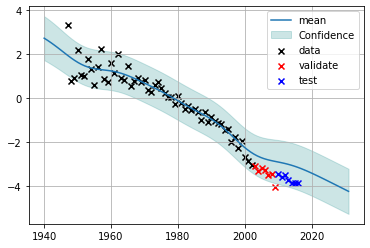

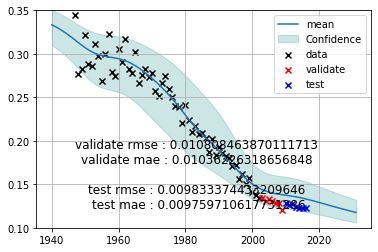

  3%|▎         | 44/1296 [02:51<31:57,  1.53s/it]

validate rmse : 0.010808463870111713 
 validate mae : 0.01036226318656848 

    test rmse : 0.009833374433209646 
 test mae : 0.009759710617731286
(('sa', 1), ('sa', 2), ('sa', 2), ('sal', 1))
params:[-1.03685102e-01  2.04747885e+02]


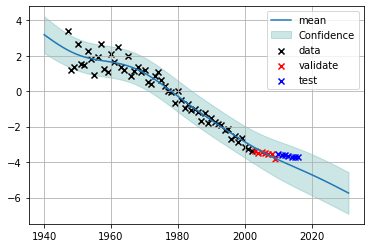

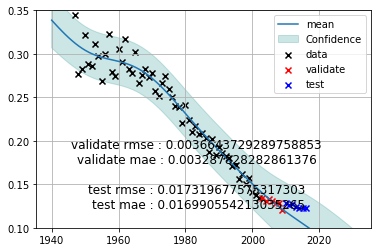

  3%|▎         | 45/1296 [02:52<34:34,  1.66s/it]

validate rmse : 0.0036643729289758853 
 validate mae : 0.003287828282861376 

    test rmse : 0.017319677575317303 
 test mae : 0.016990554213035265
(('sa', 1), ('sa', 2), ('sa', 2), ('sal', 2))
params:[-1.10426667e-01  2.18030402e+02]


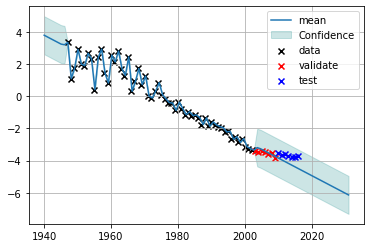

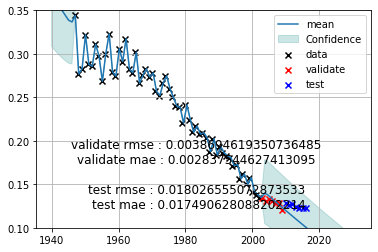

  4%|▎         | 46/1296 [02:59<1:07:05,  3.22s/it]

validate rmse : 0.0038694619350736485 
 validate mae : 0.002837544627413095 

    test rmse : 0.018026555072873533 
 test mae : 0.017490628088202214
(('sa', 1), ('sa', 2), ('sa', 2), ('box_cox', 1))
params:[-8.17929181e-02  1.60473232e+02]


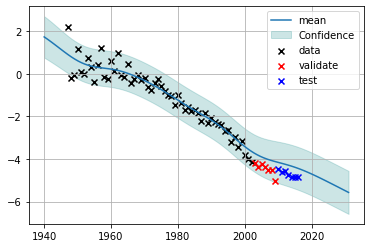

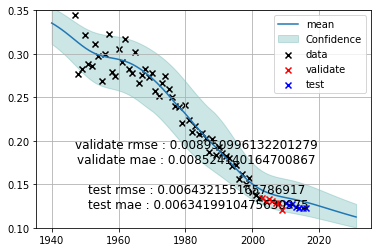

  4%|▎         | 47/1296 [03:00<53:14,  2.56s/it]  

validate rmse : 0.008950996132201279 
 validate mae : 0.008524140164700867 

    test rmse : 0.006432155165786917 
 test mae : 0.0063419910475630975
(('sa', 1), ('sa', 2), ('sa', 2), ('box_cox', 2))
params:[-8.01066502e-02  1.55903201e+02]


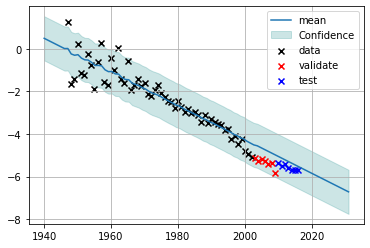

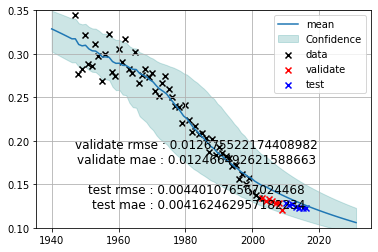

  4%|▎         | 48/1296 [03:02<44:16,  2.13s/it]

validate rmse : 0.012675522174408982 
 validate mae : 0.012466492621588663 

    test rmse : 0.004401076567024468 
 test mae : 0.004162462957182234
(('sa', 1), ('sa', 2), ('sal', 1), ('sa', 1))
params:[-1.02880310e-01  2.03246806e+02]


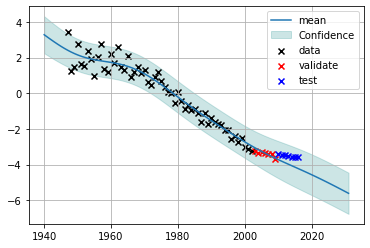

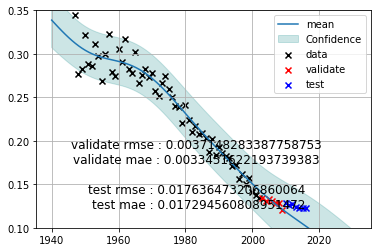

  4%|▍         | 49/1296 [03:03<42:15,  2.03s/it]

validate rmse : 0.0037148283387758753 
 validate mae : 0.0033451622193739383 

    test rmse : 0.017636473206860064 
 test mae : 0.017294560808951472
(('sa', 1), ('sa', 2), ('sal', 1), ('sa', 2))
params:[-1.02844057e-01  2.03167086e+02]


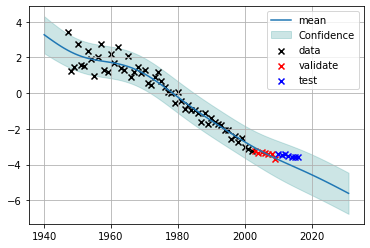

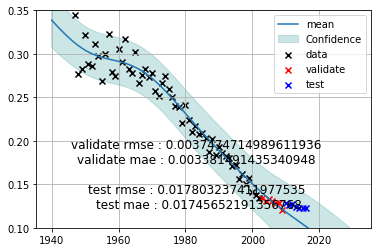

  4%|▍         | 50/1296 [03:05<42:12,  2.03s/it]

validate rmse : 0.0037474714989611936 
 validate mae : 0.003381491435340948 

    test rmse : 0.017803237411977535 
 test mae : 0.01745652191356768
(('sa', 1), ('sa', 2), ('sal', 1), ('sal', 1))
params:[-1.06422032e-01  2.10006319e+02]


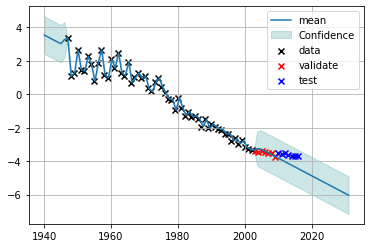

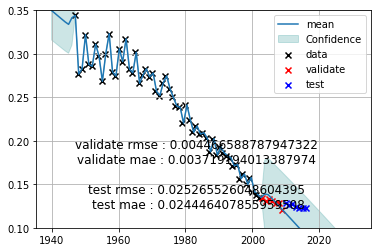

  4%|▍         | 51/1296 [03:08<43:53,  2.12s/it]

validate rmse : 0.004466588787947322 
 validate mae : 0.003719194013387974 

    test rmse : 0.025265526048604395 
 test mae : 0.024446407855959508
(('sa', 1), ('sa', 2), ('sal', 1), ('sal', 2))
params:[-1.11655256e-01  2.20447337e+02]


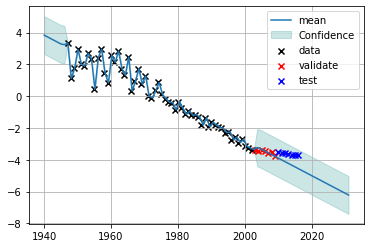

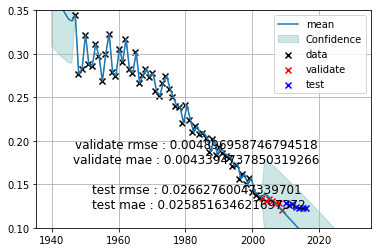

  4%|▍         | 52/1296 [03:13<1:02:41,  3.02s/it]

validate rmse : 0.004896958746794518 
 validate mae : 0.0043394737850319266 

    test rmse : 0.02662760047339701 
 test mae : 0.025851634621697372
(('sa', 1), ('sa', 2), ('sal', 1), ('box_cox', 1))
params:[-1.02715962e-01  2.01923548e+02]


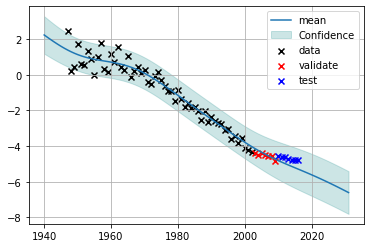

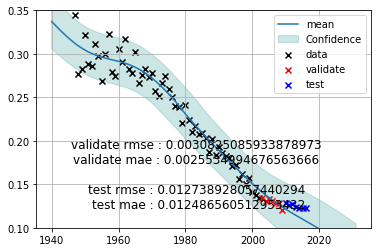

  4%|▍         | 53/1296 [03:15<59:44,  2.88s/it]  

validate rmse : 0.0030825085933878973 
 validate mae : 0.0025534994676563666 

    test rmse : 0.012738928057440294 
 test mae : 0.012486560512953432
(('sa', 1), ('sa', 2), ('sal', 1), ('box_cox', 2))
params:[-1.04219353e-01  2.03776781e+02]


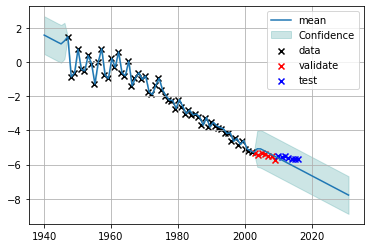

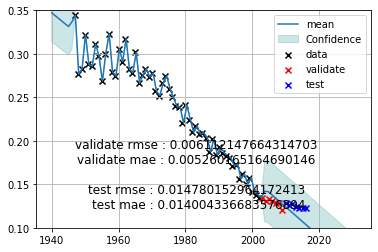

  4%|▍         | 54/1296 [03:17<54:44,  2.64s/it]

validate rmse : 0.006112147664314703 
 validate mae : 0.005260165164690146 

    test rmse : 0.014780152964172413 
 test mae : 0.014004336683576894
(('sa', 1), ('sa', 2), ('sal', 2), ('sa', 1))
params:[-1.08342916e-01  2.13591405e+02]


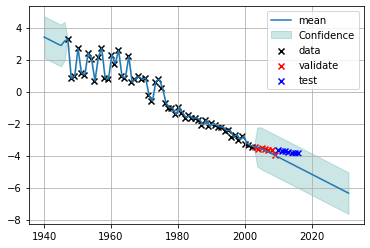

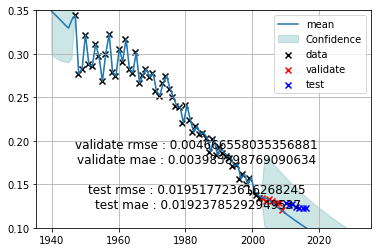

  4%|▍         | 55/1296 [03:20<51:34,  2.49s/it]

validate rmse : 0.004666558035356881 
 validate mae : 0.003983898769090634 

    test rmse : 0.019517723616268245 
 test mae : 0.01923785292949537
(('sa', 1), ('sa', 2), ('sal', 2), ('sa', 2))
params:[-1.10354092e-01  2.17880931e+02]


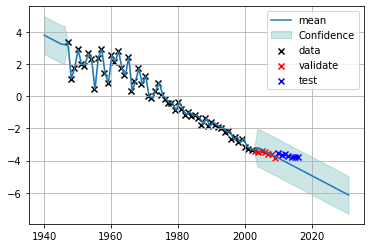

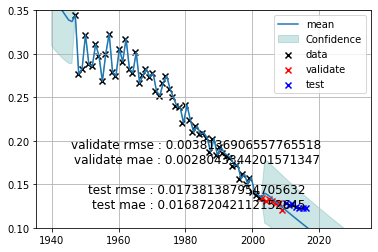

  4%|▍         | 56/1296 [03:23<57:37,  2.79s/it]

validate rmse : 0.0038136906557765518 
 validate mae : 0.0028043344201571347 

    test rmse : 0.017381387954705632 
 test mae : 0.016872042112152645
(('sa', 1), ('sa', 2), ('sal', 2), ('sal', 1))
params:[-1.10945978e-01  2.19076250e+02]


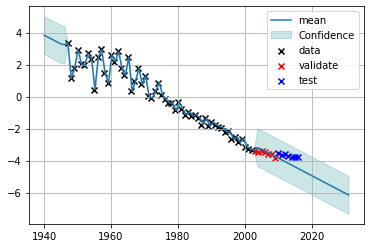

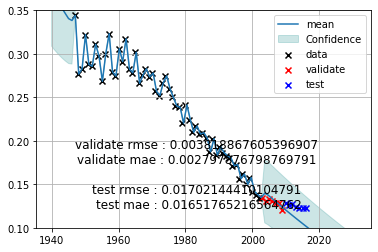

  4%|▍         | 57/1296 [03:27<1:05:21,  3.17s/it]

validate rmse : 0.003818867605396907 
 validate mae : 0.002797876798769791 

    test rmse : 0.01702144410104791 
 test mae : 0.01651765216564762
(('sa', 1), ('sa', 2), ('sal', 2), ('sal', 2))
params:[-1.11395188e-01  2.19948464e+02]


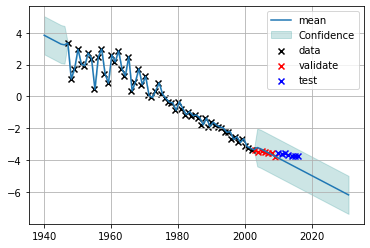

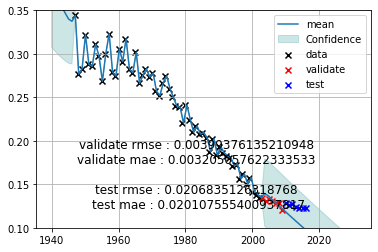

  4%|▍         | 58/1296 [03:50<3:07:21,  9.08s/it]

validate rmse : 0.00399376135210948 
 validate mae : 0.003205057622333533 

    test rmse : 0.0206835126318768 
 test mae : 0.020107555400937817
(('sa', 1), ('sa', 2), ('sal', 2), ('box_cox', 1))
params:[-7.62715697e-03  2.24496640e+01]


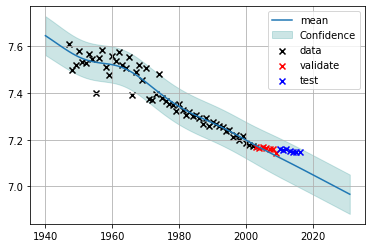

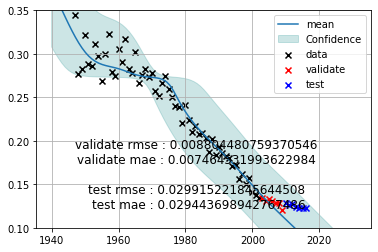

  5%|▍         | 59/1296 [03:55<2:44:09,  7.96s/it]

validate rmse : 0.008804480759370546 
 validate mae : 0.007464531993622984 

    test rmse : 0.029915221845644508 
 test mae : 0.029443698942767486
(('sa', 1), ('sa', 2), ('sal', 2), ('box_cox', 2))
params:[-1.09131942e-01  2.13559722e+02]


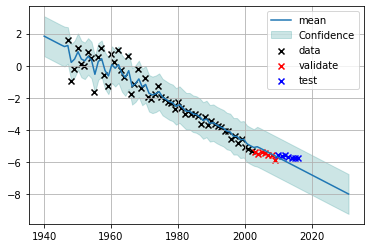

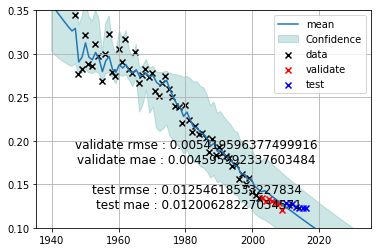

  5%|▍         | 60/1296 [04:05<2:53:22,  8.42s/it]

validate rmse : 0.005419596377499916 
 validate mae : 0.004595992337603484 

    test rmse : 0.01254618533227834 
 test mae : 0.01200628227034571
(('sa', 1), ('sa', 2), ('box_cox', 1), ('sa', 1))
params:[-7.69094428e-02  1.51138733e+02]


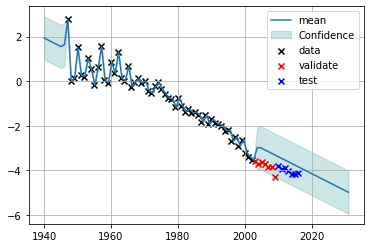

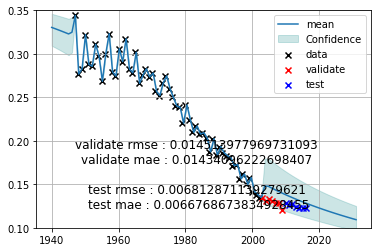

  5%|▍         | 61/1296 [04:06<2:08:09,  6.23s/it]

validate rmse : 0.014513977969731093 
 validate mae : 0.01434096222698407 

    test rmse : 0.006812871139279621 
 test mae : 0.0066768673834928455
(('sa', 1), ('sa', 2), ('box_cox', 1), ('sa', 2))
params:[-7.69095515e-02  1.51138946e+02]


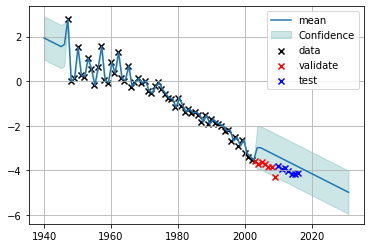

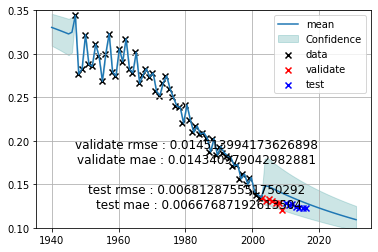

  5%|▍         | 62/1296 [04:07<1:37:35,  4.75s/it]

validate rmse : 0.014513994173626898 
 validate mae : 0.014340979042982881 

    test rmse : 0.006812875551750292 
 test mae : 0.00667687192613504
(('sa', 1), ('sa', 2), ('box_cox', 1), ('sal', 1))
params:[-1.04265959e-01  2.05918287e+02]


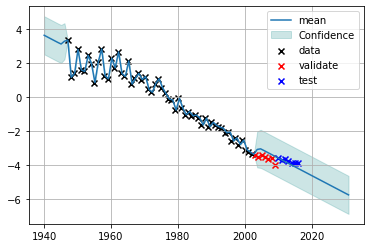

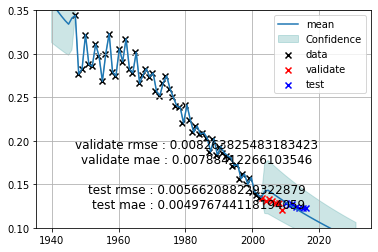

  5%|▍         | 63/1296 [04:12<1:35:34,  4.65s/it]

validate rmse : 0.008263825483183423 
 validate mae : 0.00788412266103546 

    test rmse : 0.005662088229322879 
 test mae : 0.004976744118194059
(('sa', 1), ('sa', 2), ('box_cox', 1), ('sal', 2))
params:[-1.09809320e-01  2.16825477e+02]


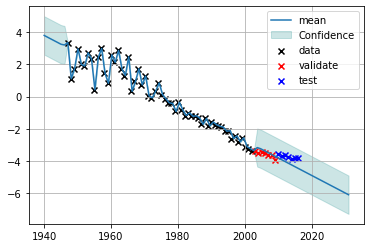

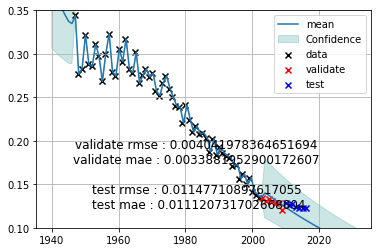

  5%|▍         | 64/1296 [04:24<2:20:11,  6.83s/it]

validate rmse : 0.004041978364651694 
 validate mae : 0.0033881952900172607 

    test rmse : 0.01147710897617055 
 test mae : 0.011120731702668004
(('sa', 1), ('sa', 2), ('box_cox', 1), ('box_cox', 1))
params:[-8.40446052e-02  1.63599960e+02]


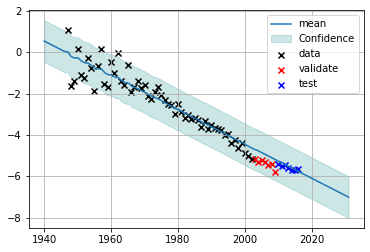

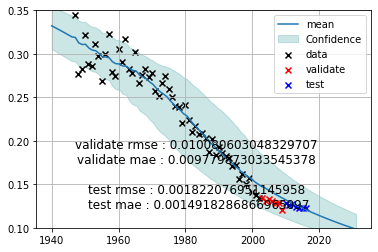

  5%|▌         | 65/1296 [04:24<1:43:17,  5.03s/it]

validate rmse : 0.010080603048329707 
 validate mae : 0.009779873033545378 

    test rmse : 0.001822076951145958 
 test mae : 0.0014918286866965097
(('sa', 1), ('sa', 2), ('box_cox', 1), ('box_cox', 2))
params:[-7.85089351e-02  1.51640459e+02]


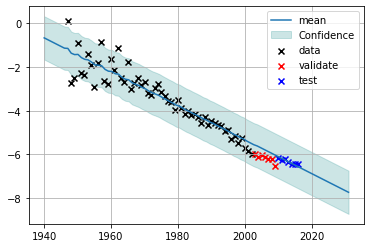

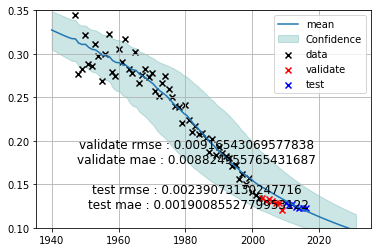

  5%|▌         | 66/1296 [04:25<1:18:17,  3.82s/it]

validate rmse : 0.00916543069577838 
 validate mae : 0.008824955765431687 

    test rmse : 0.00239073130247716 
 test mae : 0.0019008552779953122
(('sa', 1), ('sa', 2), ('box_cox', 2), ('sa', 1))
params:[-7.04458455e-02  1.37511428e+02]


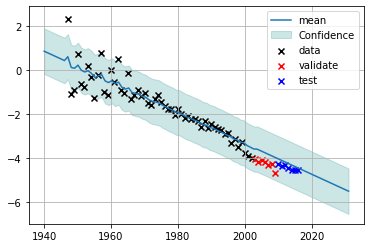

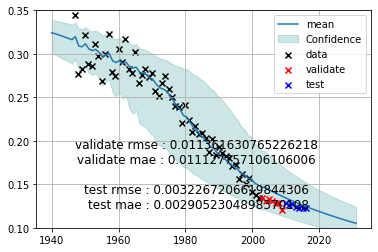

  5%|▌         | 67/1296 [04:26<1:00:15,  2.94s/it]

validate rmse : 0.011361630765226218 
 validate mae : 0.011127757106106006 

    test rmse : 0.0032267206619844306 
 test mae : 0.0029052304898370108
(('sa', 1), ('sa', 2), ('box_cox', 2), ('sa', 2))
params:[-7.04458213e-02  1.37511381e+02]


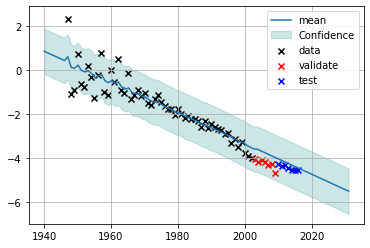

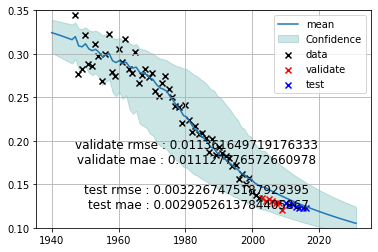

  5%|▌         | 68/1296 [04:27<48:02,  2.35s/it]  

validate rmse : 0.011361649719176333 
 validate mae : 0.011127776572660978 

    test rmse : 0.0032267475187929395 
 test mae : 0.0029052613784405867
(('sa', 1), ('sa', 2), ('box_cox', 2), ('sal', 1))
params:[-9.68242287e-02  1.91330158e+02]


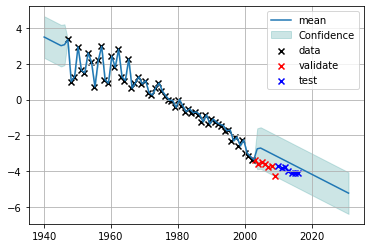

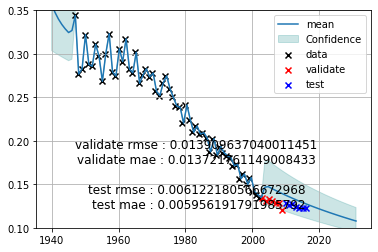

  5%|▌         | 69/1296 [04:29<45:37,  2.23s/it]

validate rmse : 0.013909637040011451 
 validate mae : 0.013721761149008433 

    test rmse : 0.006122180566672968 
 test mae : 0.005956191791985792
(('sa', 1), ('sa', 2), ('box_cox', 2), ('sal', 2))
params:[-1.05978046e+01  2.10513711e+04]


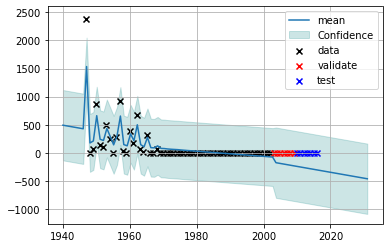

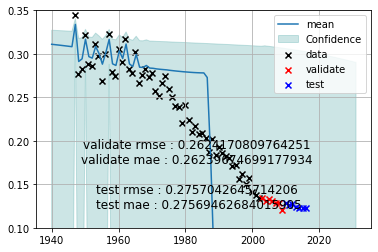

  5%|▌         | 70/1296 [04:34<1:01:10,  2.99s/it]

validate rmse : 0.2624170809764251 
 validate mae : 0.26239674699177934 

    test rmse : 0.2757042645714206 
 test mae : 0.27569462684015905
(('sa', 1), ('sa', 2), ('box_cox', 2), ('box_cox', 1))
params:[-7.61440459e-02  1.46991466e+02]


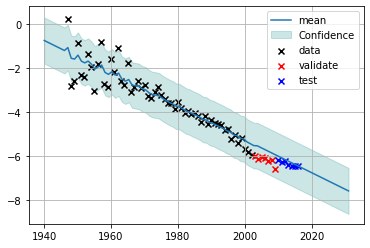

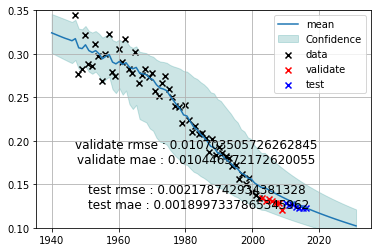

  5%|▌         | 71/1296 [04:35<48:37,  2.38s/it]  

validate rmse : 0.010703505726262845 
 validate mae : 0.010446572172620055 

    test rmse : 0.002178742934381328 
 test mae : 0.0018997337865345962
(('sa', 1), ('sa', 2), ('box_cox', 2), ('box_cox', 2))
params:[-6.74863099e-02  1.28871933e+02]


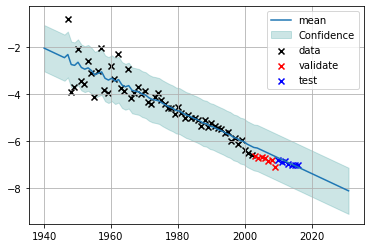

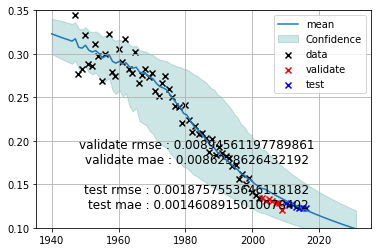

  6%|▌         | 72/1296 [04:36<39:42,  1.95s/it]

validate rmse : 0.00894561197789861 
 validate mae : 0.0086238626432192 

    test rmse : 0.0018757553646118182 
 test mae : 0.0014608915010078402
(('sa', 1), ('sal', 1), ('sa', 1), ('sa', 1))
params:[-1.0277704e-01  2.0302026e+02]


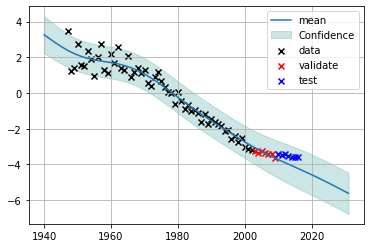

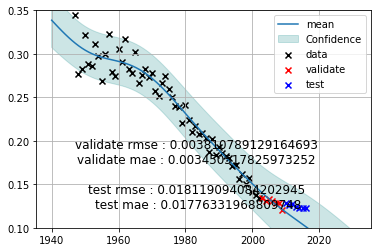

  6%|▌         | 73/1296 [04:38<39:08,  1.92s/it]

validate rmse : 0.003810789129164693 
 validate mae : 0.003450517825973252 

    test rmse : 0.018119094084202945 
 test mae : 0.01776331968809748
(('sa', 1), ('sal', 1), ('sa', 1), ('sa', 2))
params:[-1.02816455e-01  2.03108491e+02]


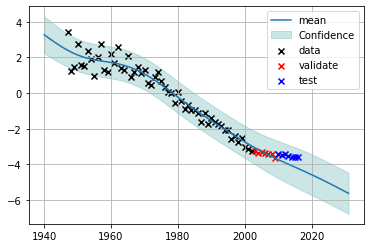

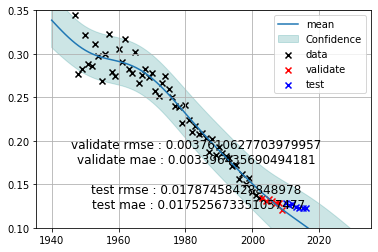

  6%|▌         | 74/1296 [04:40<38:40,  1.90s/it]

validate rmse : 0.0037610627703979957 
 validate mae : 0.003396435690494181 

    test rmse : 0.01787458428848978 
 test mae : 0.017525673351057477
(('sa', 1), ('sal', 1), ('sa', 1), ('sal', 1))
params:[-1.07112444e-01  2.11365383e+02]


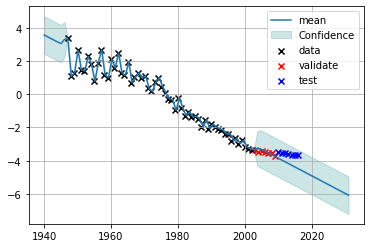

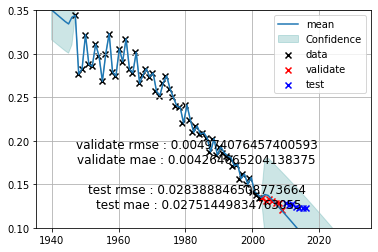

  6%|▌         | 75/1296 [04:41<37:47,  1.86s/it]

validate rmse : 0.004974076457400593 
 validate mae : 0.004264665204138375 

    test rmse : 0.028388846508773664 
 test mae : 0.02751449834763055
(('sa', 1), ('sal', 1), ('sa', 1), ('sal', 2))
params:[-1.11772656e-01  2.20676873e+02]


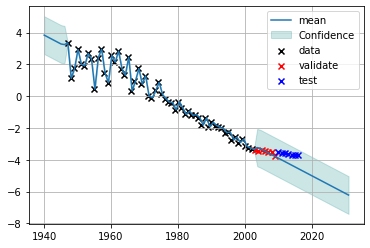

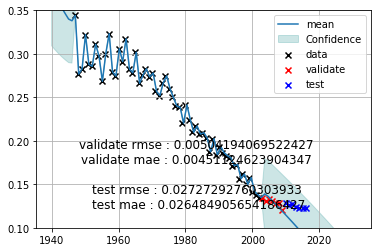

  6%|▌         | 76/1296 [04:46<56:58,  2.80s/it]

validate rmse : 0.00504194069522427 
 validate mae : 0.00451124623904347 

    test rmse : 0.02727292760303933 
 test mae : 0.026484905654186427
(('sa', 1), ('sal', 1), ('sa', 1), ('box_cox', 1))
params:[-1.01668044e-01  1.99879034e+02]


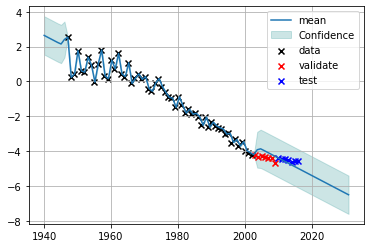

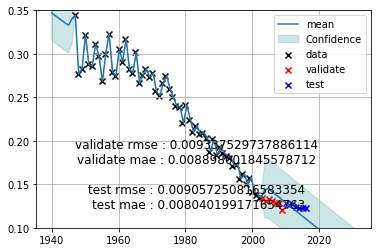

  6%|▌         | 77/1296 [04:48<50:59,  2.51s/it]

validate rmse : 0.009337529737886114 
 validate mae : 0.008898001845578712 

    test rmse : 0.009057250816583354 
 test mae : 0.008040199171654763
(('sa', 1), ('sal', 1), ('sa', 1), ('box_cox', 2))
params:[-1.02451740e-01  2.00342721e+02]


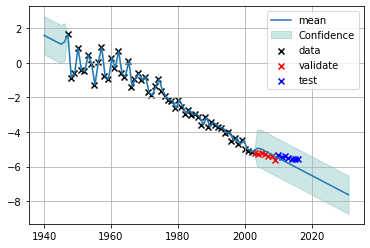

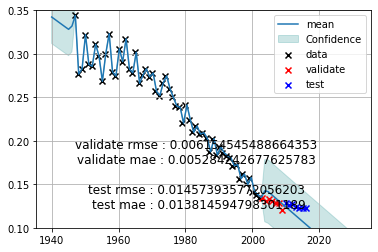

  6%|▌         | 78/1296 [04:50<46:25,  2.29s/it]

validate rmse : 0.006154545488664353 
 validate mae : 0.005284242677625783 

    test rmse : 0.014573935772056203 
 test mae : 0.013814594798301189
(('sa', 1), ('sal', 1), ('sa', 2), ('sa', 1))
params:[-1.02639503e-01  2.02716766e+02]


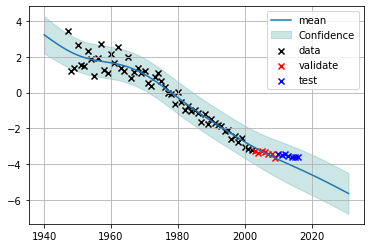

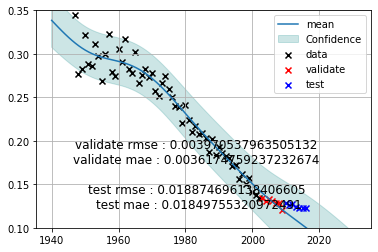

  6%|▌         | 79/1296 [04:52<43:18,  2.14s/it]

validate rmse : 0.003970537963505132 
 validate mae : 0.0036174759237232674 

    test rmse : 0.018874696138406605 
 test mae : 0.01849755320972491
(('sa', 1), ('sal', 1), ('sa', 2), ('sa', 2))
params:[-1.02653202e-01  2.02745997e+02]


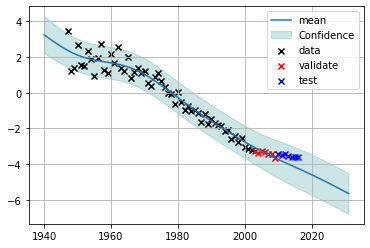

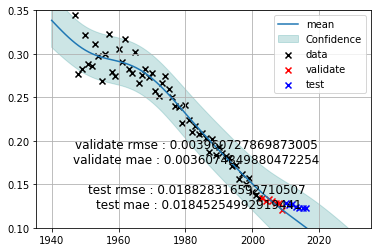

  6%|▌         | 80/1296 [04:54<42:27,  2.09s/it]

validate rmse : 0.003960727869873005 
 validate mae : 0.0036074849880472254 

    test rmse : 0.018828316592710507 
 test mae : 0.01845254992919441
(('sa', 1), ('sal', 1), ('sa', 2), ('sal', 1))
params:[-1.06603904e-01  2.10364276e+02]


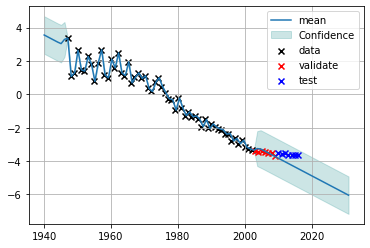

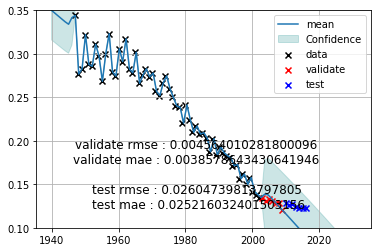

  6%|▋         | 81/1296 [04:56<42:52,  2.12s/it]

validate rmse : 0.004564010281800096 
 validate mae : 0.0038578643430641946 

    test rmse : 0.02604739813797805 
 test mae : 0.025216032401503156
(('sa', 1), ('sal', 1), ('sa', 2), ('sal', 2))
params:[-1.02479410e-01  2.02072517e+02]


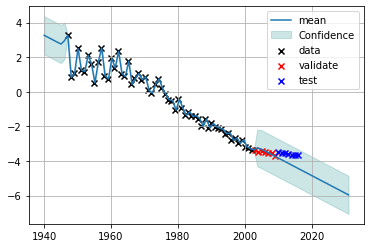

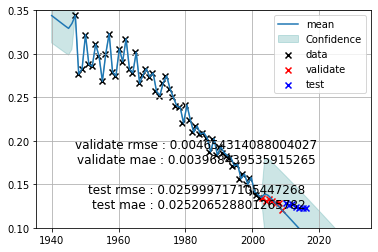

  6%|▋         | 82/1296 [05:03<1:10:42,  3.49s/it]

validate rmse : 0.004654314088004027 
 validate mae : 0.003968439535915265 

    test rmse : 0.025999717105447268 
 test mae : 0.025206528801265782
(('sa', 1), ('sal', 1), ('sa', 2), ('box_cox', 1))
params:[-1.01231680e-01  1.99027011e+02]


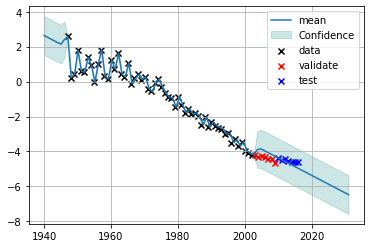

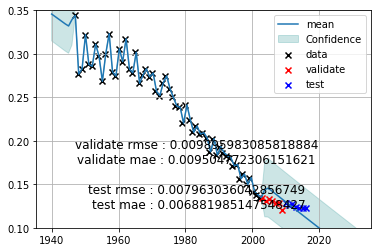

  6%|▋         | 83/1296 [05:05<1:02:01,  3.07s/it]

validate rmse : 0.009895983085818884 
 validate mae : 0.009504772306151621 

    test rmse : 0.007963036042856749 
 test mae : 0.006881985147548427
(('sa', 1), ('sal', 1), ('sa', 2), ('box_cox', 2))
params:[-1.03597905e-01  2.02645455e+02]


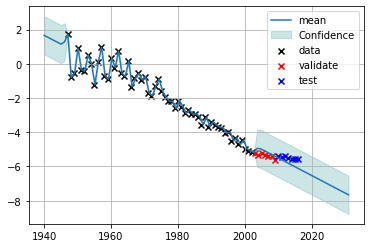

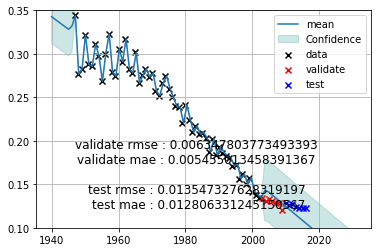

  6%|▋         | 84/1296 [05:07<56:11,  2.78s/it]  

validate rmse : 0.006347803773493393 
 validate mae : 0.005455013458391367 

    test rmse : 0.013547327628319197 
 test mae : 0.012806331245150567
(('sa', 1), ('sal', 1), ('sal', 1), ('sa', 1))
params:[-1.06451528e-01  2.10077137e+02]


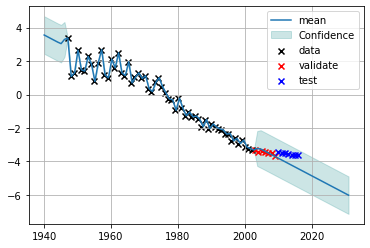

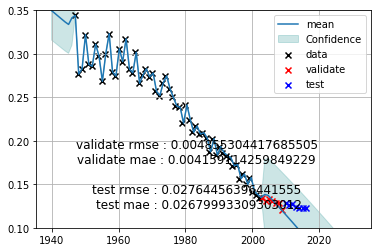

  7%|▋         | 85/1296 [05:09<51:24,  2.55s/it]

validate rmse : 0.004855304417685505 
 validate mae : 0.004159114259849229 

    test rmse : 0.02764456396441555 
 test mae : 0.02679993309303012
(('sa', 1), ('sal', 1), ('sal', 1), ('sa', 2))
params:[-1.05889166e-01  2.08969983e+02]


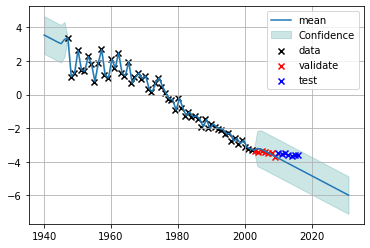

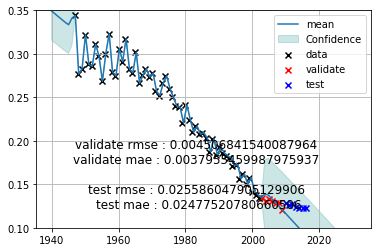

  7%|▋         | 86/1296 [05:12<52:38,  2.61s/it]

validate rmse : 0.004506841540087964 
 validate mae : 0.0037955459987975937 

    test rmse : 0.025586047905129906 
 test mae : 0.02477520780660506
(('sa', 1), ('sal', 1), ('sal', 1), ('sal', 1))
params:[-1.07926823e-01  2.12938819e+02]


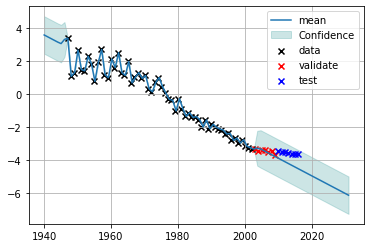

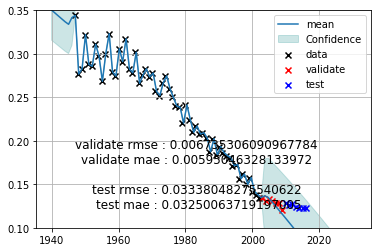

  7%|▋         | 87/1296 [05:13<48:33,  2.41s/it]

validate rmse : 0.006735306090967784 
 validate mae : 0.00595046328133972 

    test rmse : 0.03338048275540622 
 test mae : 0.03250063719197005
(('sa', 1), ('sal', 1), ('sal', 1), ('sal', 2))
params:[-1.47079927e+08  2.92144987e+11]


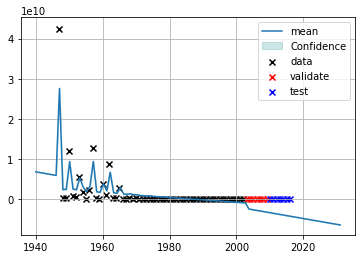

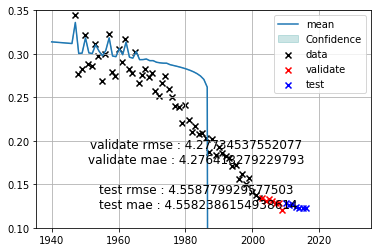

  7%|▋         | 88/1296 [05:18<59:03,  2.93s/it]

validate rmse : 4.27734537552077 
 validate mae : 4.276418279229793 

    test rmse : 4.558779929577503 
 test mae : 4.5582386154938614
(('sa', 1), ('sal', 1), ('sal', 1), ('box_cox', 1))
params:[-1.04465131e-01  2.05237281e+02]


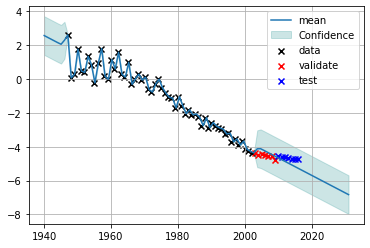

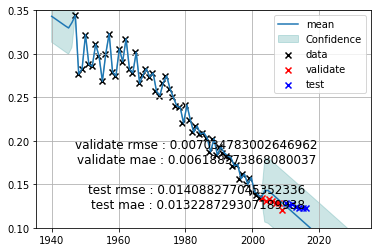

  7%|▋         | 89/1296 [05:20<53:33,  2.66s/it]

validate rmse : 0.007034783002646962 
 validate mae : 0.006188573868080037 

    test rmse : 0.014088277045352336 
 test mae : 0.013228729307189938
(('sa', 1), ('sal', 1), ('sal', 1), ('box_cox', 2))
params:[-1.06658568e-01  2.08392459e+02]


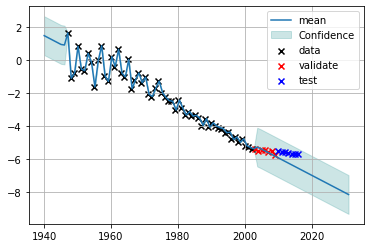

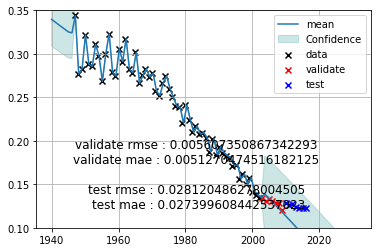

  7%|▋         | 90/1296 [05:22<52:23,  2.61s/it]

validate rmse : 0.005607350867342293 
 validate mae : 0.0051270474516182125 

    test rmse : 0.028120486278004505 
 test mae : 0.027399608442537023
(('sa', 1), ('sal', 1), ('sal', 2), ('sa', 1))
params:[-1.11797711e-01  2.20723719e+02]


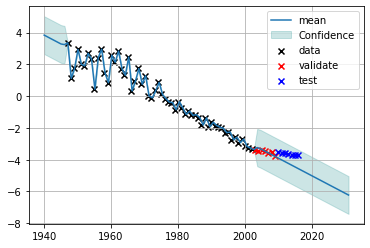

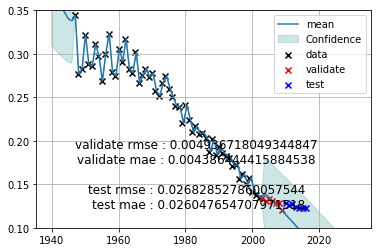

  7%|▋         | 91/1296 [05:27<1:08:18,  3.40s/it]

validate rmse : 0.004936718049344847 
 validate mae : 0.004386444415884538 

    test rmse : 0.026828527860057544 
 test mae : 0.026047654707971518
(('sa', 1), ('sal', 1), ('sal', 2), ('sa', 2))
params:[-1.12231743e-01  2.21589654e+02]


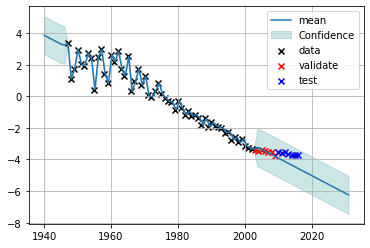

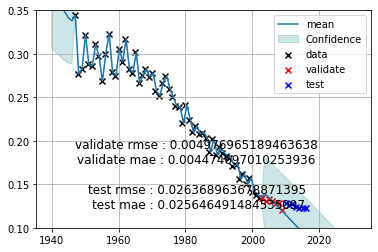

  7%|▋         | 92/1296 [05:36<1:39:08,  4.94s/it]

validate rmse : 0.004976965189463638 
 validate mae : 0.004474697010253936 

    test rmse : 0.026368963678871395 
 test mae : 0.025646491484535097
(('sa', 1), ('sal', 1), ('sal', 2), ('sal', 1))
params:[-1.11434745e-01  2.20019654e+02]


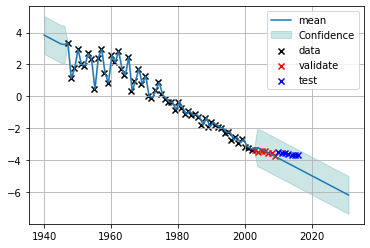

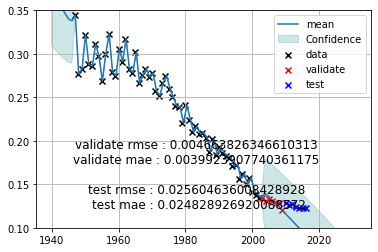

  7%|▋         | 93/1296 [05:41<1:41:47,  5.08s/it]

validate rmse : 0.004663826346610313 
 validate mae : 0.0039923907740361175 

    test rmse : 0.025604636008428928 
 test mae : 0.024828926920088572
(('sa', 1), ('sal', 1), ('sal', 2), ('sal', 2))
params:[-6.06208078e-02  1.19452582e+02]


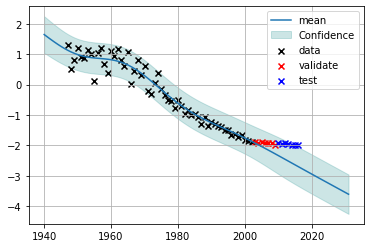

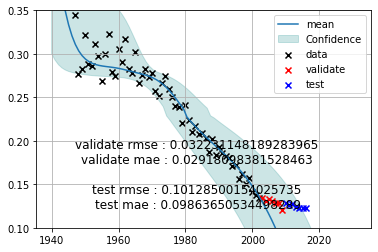

  7%|▋         | 94/1296 [06:10<4:01:04, 12.03s/it]

validate rmse : 0.032231148189283965 
 validate mae : 0.02918098381528463 

    test rmse : 0.10128500154025735 
 test mae : 0.09863650534498289
(('sa', 1), ('sal', 1), ('sal', 2), ('box_cox', 1))
params:[-1.10589368e-01  2.17418945e+02]


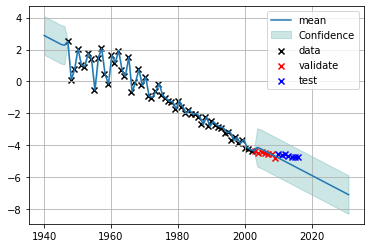

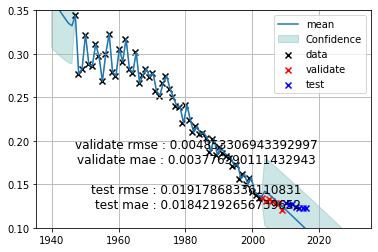

  7%|▋         | 95/1296 [06:15<3:18:48,  9.93s/it]

validate rmse : 0.004853306943392997 
 validate mae : 0.003776390111432943 

    test rmse : 0.01917868336110831 
 test mae : 0.01842192656739652
(('sa', 1), ('sal', 1), ('sal', 2), ('box_cox', 2))
params:[-1.10386538e-01  2.16017644e+02]


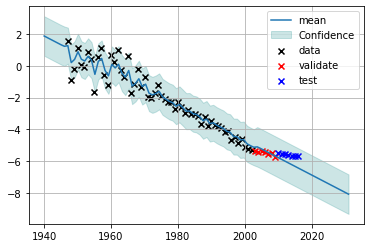

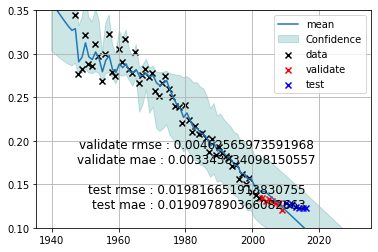

  7%|▋         | 96/1296 [06:19<2:46:34,  8.33s/it]

validate rmse : 0.00462565973591968 
 validate mae : 0.003343834098150557 

    test rmse : 0.019816651913830755 
 test mae : 0.019097890366082663
(('sa', 1), ('sal', 1), ('box_cox', 1), ('sa', 1))
params:[-9.32223567e-02  1.83574228e+02]


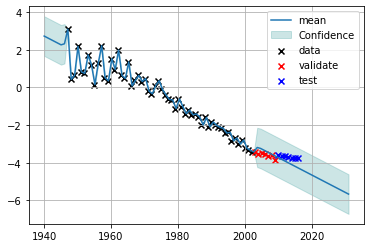

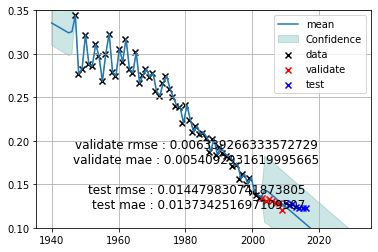

  7%|▋         | 97/1296 [06:22<2:11:13,  6.57s/it]

validate rmse : 0.006339266333572729 
 validate mae : 0.0054092931619995665 

    test rmse : 0.014479830741873805 
 test mae : 0.013734251697109507
(('sa', 1), ('sal', 1), ('box_cox', 1), ('sa', 2))
params:[-9.46286900e-02  1.86289027e+02]


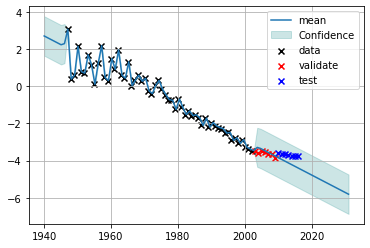

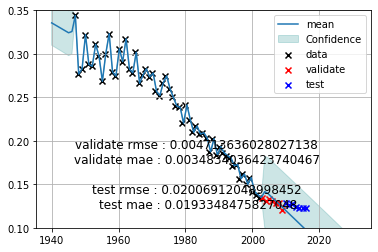

  8%|▊         | 98/1296 [06:24<1:43:54,  5.20s/it]

validate rmse : 0.004713636028027138 
 validate mae : 0.0034834036423740467 

    test rmse : 0.02006912048998452 
 test mae : 0.0193348475827048
(('sa', 1), ('sal', 1), ('box_cox', 1), ('sal', 1))
params:[-1.15291953e-01  2.27603309e+02]


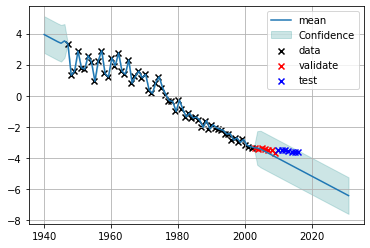

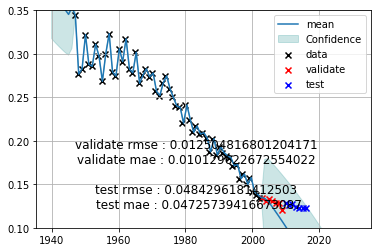

  8%|▊         | 99/1296 [06:26<1:24:54,  4.26s/it]

validate rmse : 0.012504816801204171 
 validate mae : 0.010129622672554022 

    test rmse : 0.0484296181412503 
 test mae : 0.04725739416673087
(('sa', 1), ('sal', 1), ('box_cox', 1), ('sal', 2))
params:[-1.12163672e-01  2.21454711e+02]


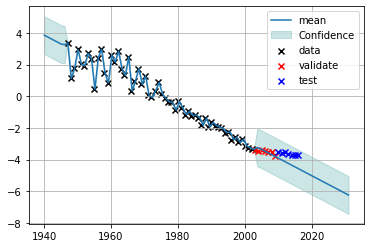

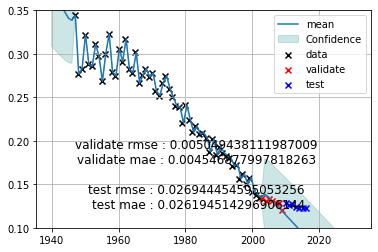

  8%|▊         | 100/1296 [06:37<2:07:27,  6.39s/it]

validate rmse : 0.005049438111987009 
 validate mae : 0.004546877997818263 

    test rmse : 0.026944454595053256 
 test mae : 0.026194514296906144
(('sa', 1), ('sal', 1), ('box_cox', 1), ('box_cox', 1))
params:[-1.05248069e-01  2.05707283e+02]


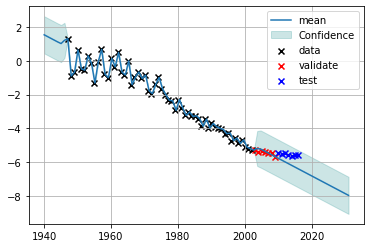

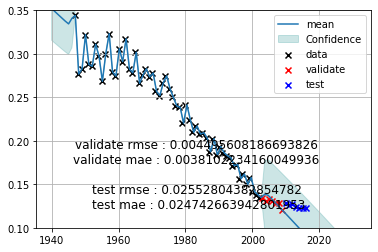

  8%|▊         | 101/1296 [06:39<1:38:39,  4.95s/it]

validate rmse : 0.004495608186693826 
 validate mae : 0.0038102234160049936 

    test rmse : 0.02552804382854782 
 test mae : 0.024742663942801953
(('sa', 1), ('sal', 1), ('box_cox', 1), ('box_cox', 2))
params:[-9.63101915e-02  1.86977497e+02]


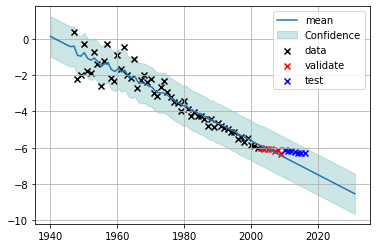

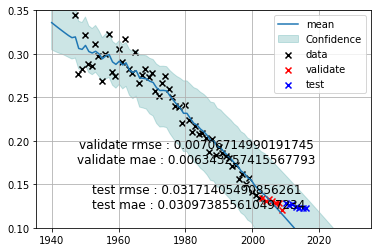

  8%|▊         | 102/1296 [06:40<1:19:22,  3.99s/it]

validate rmse : 0.00706714990191745 
 validate mae : 0.006343257415567793 

    test rmse : 0.03171405490856261 
 test mae : 0.030973855610497234
(('sa', 1), ('sal', 1), ('box_cox', 2), ('sa', 1))
params:[-8.61215542e-02  1.68838651e+02]


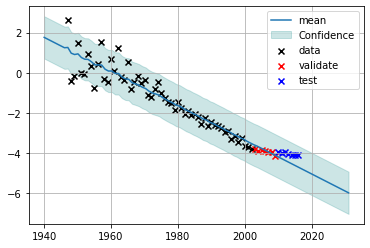

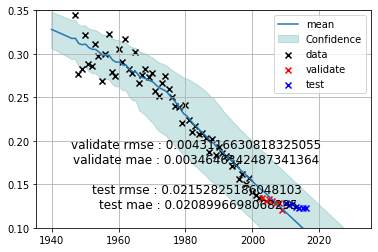

  8%|▊         | 103/1296 [06:44<1:15:47,  3.81s/it]

validate rmse : 0.0043116630818325055 
 validate mae : 0.0034646342487341364 

    test rmse : 0.02152825186048103 
 test mae : 0.0208996698068295
(('sa', 1), ('sal', 1), ('box_cox', 2), ('sa', 2))
params:[-8.61065622e-02  1.68797105e+02]


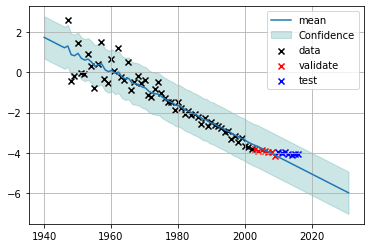

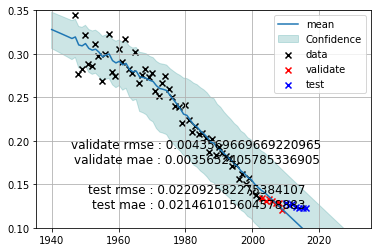

  8%|▊         | 104/1296 [06:46<1:03:53,  3.22s/it]

validate rmse : 0.0043569669669220965 
 validate mae : 0.0035652405785336905 

    test rmse : 0.022092582275384107 
 test mae : 0.021461015604578883
(('sa', 1), ('sal', 1), ('box_cox', 2), ('sal', 1))
params:[-1.13677996e-01  2.24453908e+02]


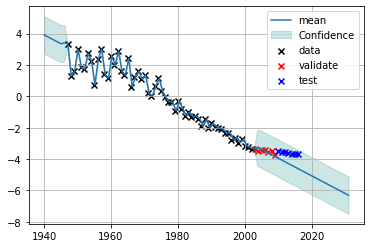

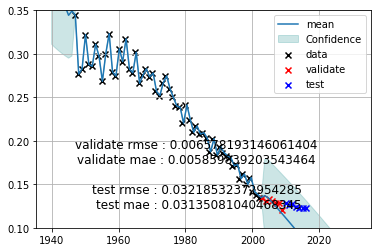

  8%|▊         | 105/1296 [06:48<55:38,  2.80s/it]  

validate rmse : 0.006578193146061404 
 validate mae : 0.005859839203543464 

    test rmse : 0.03218532372954285 
 test mae : 0.03135081040468345
(('sa', 1), ('sal', 1), ('box_cox', 2), ('sal', 2))
params:[-1.10995159e-01  2.19160140e+02]


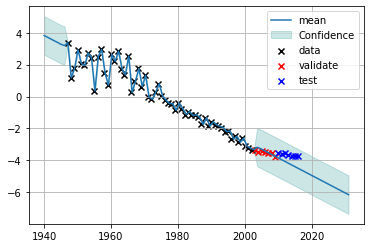

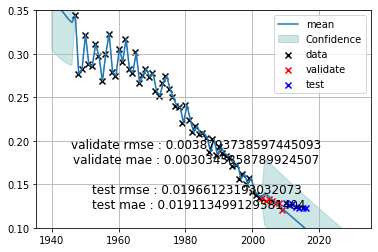

  8%|▊         | 106/1296 [06:55<1:21:25,  4.11s/it]

validate rmse : 0.0038793738597445093 
 validate mae : 0.0030345858789924507 

    test rmse : 0.01966123193032073 
 test mae : 0.019113499129581404
(('sa', 1), ('sal', 1), ('box_cox', 2), ('box_cox', 1))
params:[-9.65059283e-02  1.87332992e+02]


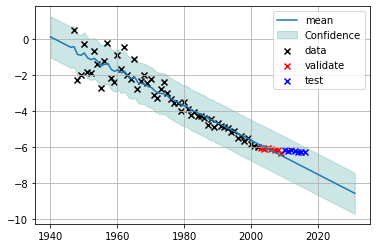

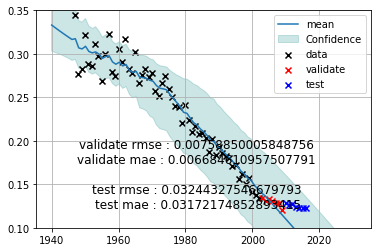

  8%|▊         | 107/1296 [06:56<1:07:27,  3.40s/it]

validate rmse : 0.00758850005848756 
 validate mae : 0.006684610957507791 

    test rmse : 0.03244327546679793 
 test mae : 0.03172174852893415
(('sa', 1), ('sal', 1), ('box_cox', 2), ('box_cox', 2))
params:[-8.39715262e-02  1.61553385e+02]


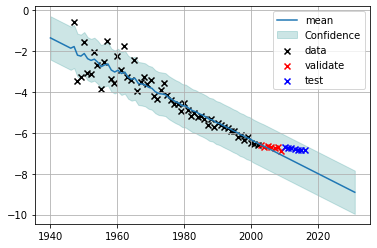

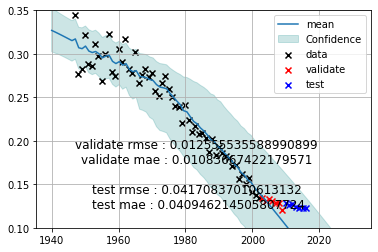

  8%|▊         | 108/1296 [06:58<56:54,  2.87s/it]  

validate rmse : 0.012555535588990899 
 validate mae : 0.01083667422179571 

    test rmse : 0.04170837010613132 
 test mae : 0.040946214505807724
(('sa', 1), ('sal', 2), ('sa', 1), ('sa', 1))
params:[-1.08727568e-01  2.14748123e+02]


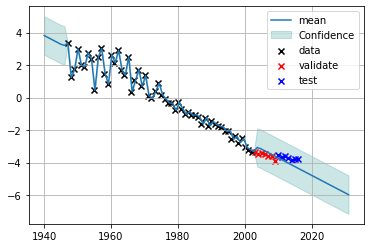

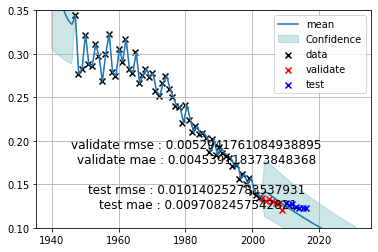

  8%|▊         | 109/1296 [07:54<6:12:04, 18.81s/it]

validate rmse : 0.0052941761084938895 
 validate mae : 0.004539118373848368 

    test rmse : 0.010140252783537931 
 test mae : 0.0097082457542821
(('sa', 1), ('sal', 2), ('sa', 1), ('sa', 2))
params:[-1.10366083e-01  2.17917035e+02]


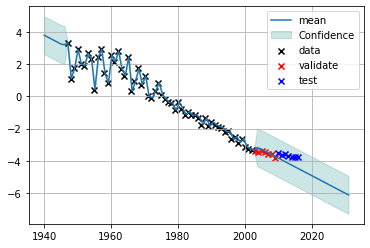

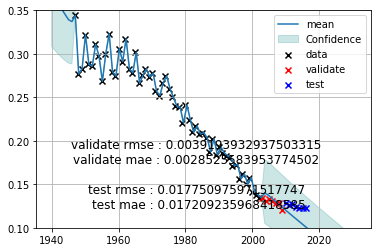

  8%|▊         | 110/1296 [08:03<5:15:56, 15.98s/it]

validate rmse : 0.0039193932937503315 
 validate mae : 0.0028525583953774502 

    test rmse : 0.017750975971517747 
 test mae : 0.017209235968418585
(('sa', 1), ('sal', 2), ('sa', 1), ('sal', 1))
params:[-1.10293338e-01  2.17787694e+02]


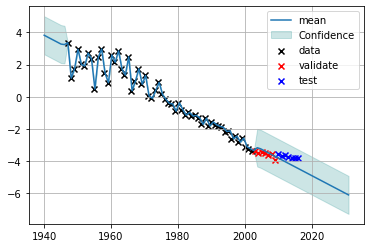

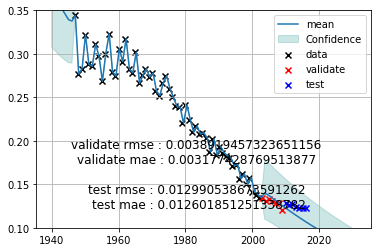

  9%|▊         | 111/1296 [08:08<4:07:26, 12.53s/it]

validate rmse : 0.0038919457323651156 
 validate mae : 0.003177428769513877 

    test rmse : 0.012990538673591262 
 test mae : 0.012601851251338782
(('sa', 1), ('sal', 2), ('sa', 1), ('sal', 2))
params:[-2.92948547e+03  5.74052781e+06]


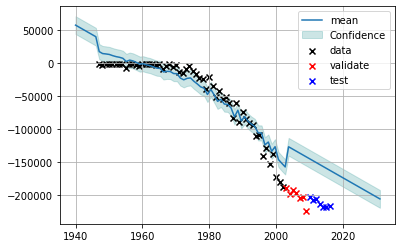

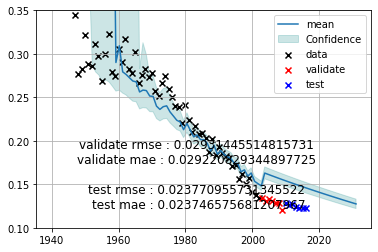

  9%|▊         | 112/1296 [08:26<4:41:58, 14.29s/it]

validate rmse : 0.02931445514815731 
 validate mae : 0.029220829344897725 

    test rmse : 0.023770955731345522 
 test mae : 0.023746575681207967
(('sa', 1), ('sal', 2), ('sa', 1), ('box_cox', 1))
params:[-7.29352177e-02  1.44104888e+02]


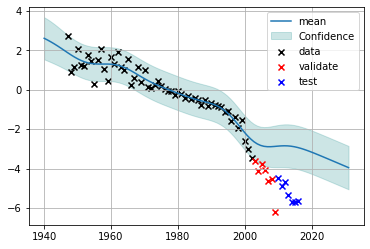

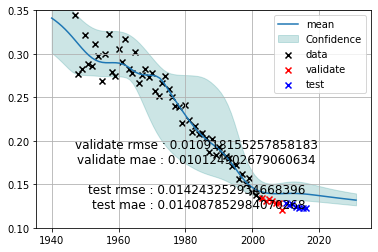

  9%|▊         | 113/1296 [08:29<3:33:28, 10.83s/it]

validate rmse : 0.010918155257858183 
 validate mae : 0.010124902679060634 

    test rmse : 0.014243252934668396 
 test mae : 0.014087852984070268
(('sa', 1), ('sal', 2), ('sa', 1), ('box_cox', 2))
params:[-1.08960538e-01  2.13216913e+02]


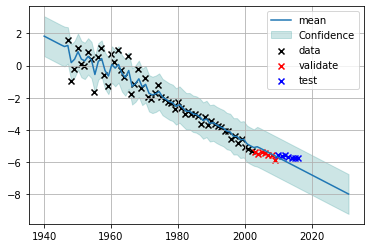

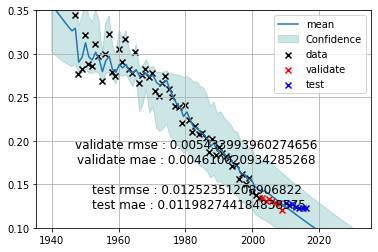

  9%|▉         | 114/1296 [08:34<2:56:24,  8.95s/it]

validate rmse : 0.005433993960274656 
 validate mae : 0.004610020934285268 

    test rmse : 0.01252351208906822 
 test mae : 0.011982744184838575
(('sa', 1), ('sal', 2), ('sa', 2), ('sa', 1))
params:[-1.10202066e-01  2.17600794e+02]


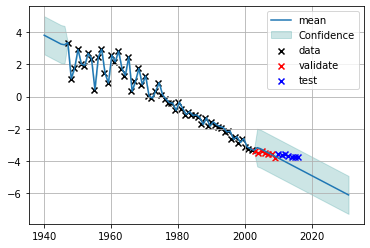

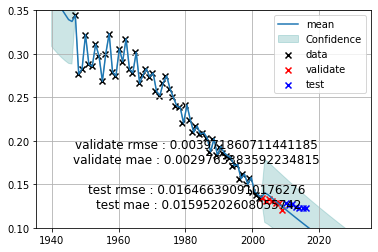

  9%|▉         | 115/1296 [08:36<2:19:46,  7.10s/it]

validate rmse : 0.003971860711441185 
 validate mae : 0.0029763383592234815 

    test rmse : 0.016466390910176276 
 test mae : 0.01595202608055742
(('sa', 1), ('sal', 2), ('sa', 2), ('sa', 2))
params:[-7.90221555e-02  1.56172463e+02]


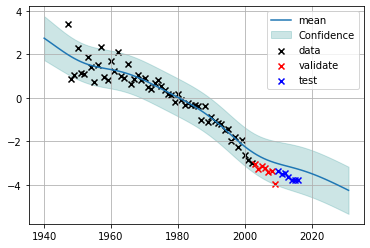

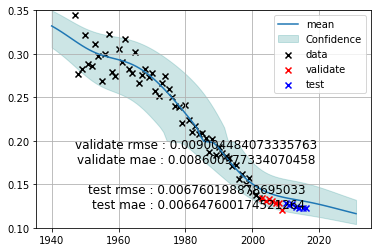

  9%|▉         | 116/1296 [08:38<1:47:47,  5.48s/it]

validate rmse : 0.009004484073335763 
 validate mae : 0.008600977334070458 

    test rmse : 0.006760198878695033 
 test mae : 0.006647600174521264
(('sa', 1), ('sal', 2), ('sa', 2), ('sal', 1))
params:[-9.96887657e-02  1.96627244e+02]


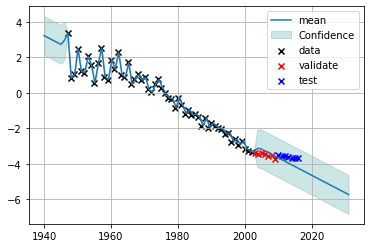

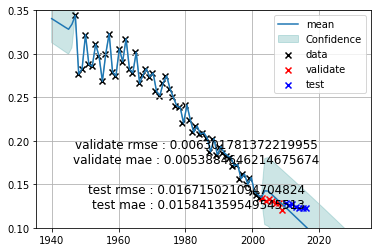

  9%|▉         | 117/1296 [08:44<1:48:34,  5.53s/it]

validate rmse : 0.006301781372219955 
 validate mae : 0.0053884646214675674 

    test rmse : 0.016715021094704824 
 test mae : 0.015841359549545513
(('sa', 1), ('sal', 2), ('sa', 2), ('sal', 2))
params:[-1.11067930e-01  2.19256413e+02]


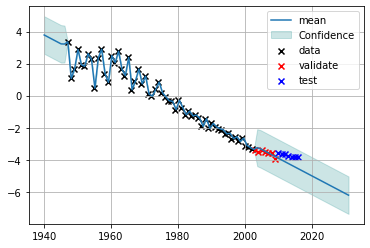

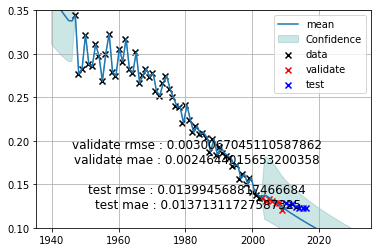

  9%|▉         | 118/1296 [09:06<3:28:21, 10.61s/it]

validate rmse : 0.0030067045110587862 
 validate mae : 0.0024644015653200358 

    test rmse : 0.013994568817466684 
 test mae : 0.01371311727587325
(('sa', 1), ('sal', 2), ('sa', 2), ('box_cox', 1))
params:[-1.09882280e-01  2.15921743e+02]


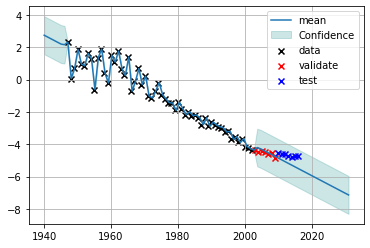

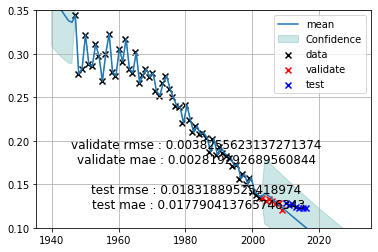

  9%|▉         | 119/1296 [09:12<3:00:42,  9.21s/it]

validate rmse : 0.0038255623137271374 
 validate mae : 0.002819292689560844 

    test rmse : 0.01831889525418974 
 test mae : 0.017790413765746343
(('sa', 1), ('sal', 2), ('sa', 2), ('box_cox', 2))
params:[-8.71763979e-02  1.69917715e+02]


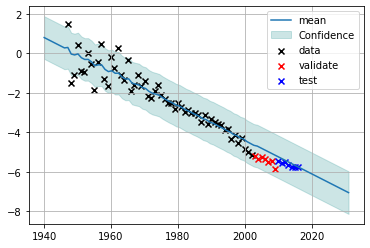

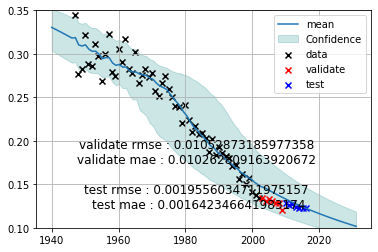

  9%|▉         | 120/1296 [09:15<2:24:10,  7.36s/it]

validate rmse : 0.01052873185977358 
 validate mae : 0.010262809163920672 

    test rmse : 0.0019556034711975157 
 test mae : 0.001642346641983174
(('sa', 1), ('sal', 2), ('sal', 1), ('sa', 1))
params:[-1.10912069e-01  2.19010769e+02]


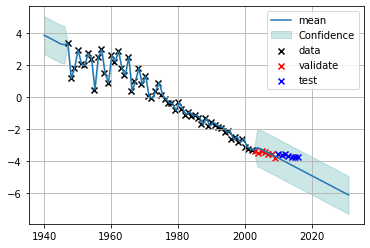

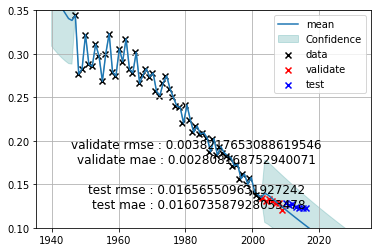

  9%|▉         | 121/1296 [09:19<2:05:48,  6.42s/it]

validate rmse : 0.0038217653088619546 
 validate mae : 0.002808168752940071 

    test rmse : 0.016565509631927242 
 test mae : 0.016073587928053478
(('sa', 1), ('sal', 2), ('sal', 1), ('sa', 2))
params:[-1.10977114e-01  2.19130366e+02]


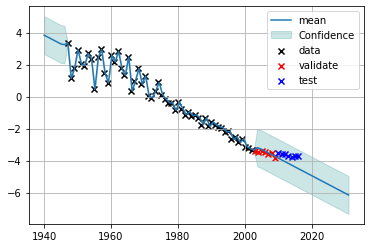

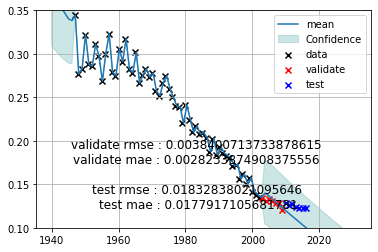

  9%|▉         | 122/1296 [09:25<1:58:32,  6.06s/it]

validate rmse : 0.0038400713733878615 
 validate mae : 0.0028233874908375556 

    test rmse : 0.01832838021095646 
 test mae : 0.0177917105681781
(('sa', 1), ('sal', 2), ('sal', 1), ('sal', 1))
params:[-1.10991371e-01  2.19157426e+02]


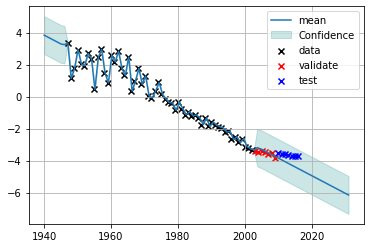

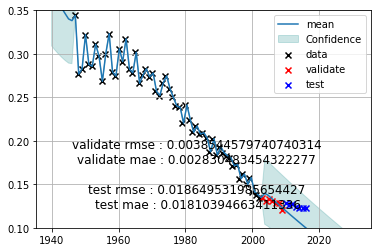

  9%|▉         | 123/1296 [10:03<5:05:46, 15.64s/it]

validate rmse : 0.0038544579740740314 
 validate mae : 0.002830483454322277 

    test rmse : 0.018649531985654427 
 test mae : 0.01810394663411336
(('sa', 1), ('sal', 2), ('sal', 1), ('sal', 2))
params:[-1.07706869e-01  2.12448240e+02]


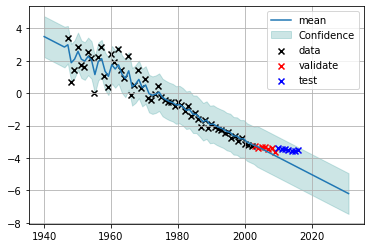

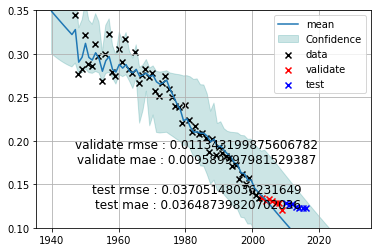

 10%|▉         | 124/1296 [10:15<4:46:08, 14.65s/it]

validate rmse : 0.011343199875606782 
 validate mae : 0.009589997981529387 

    test rmse : 0.03705148036231649 
 test mae : 0.03648739820702036
(('sa', 1), ('sal', 2), ('sal', 1), ('box_cox', 1))
params:[-1.09545635e-01  2.15401693e+02]


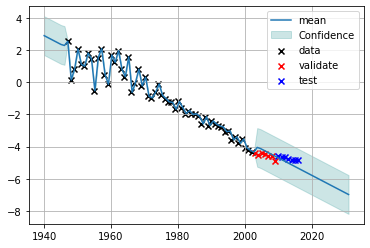

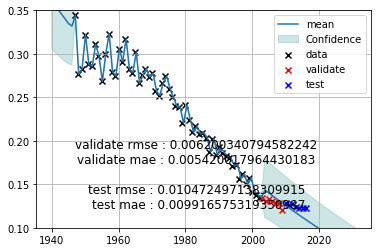

 10%|▉         | 125/1296 [10:18<3:37:52, 11.16s/it]

validate rmse : 0.006200340794582242 
 validate mae : 0.005420017964430183 

    test rmse : 0.010472497138309915 
 test mae : 0.009916575319350987
(('sa', 1), ('sal', 2), ('sal', 1), ('box_cox', 2))
params:[-8.78316561e-02  1.70497085e+02]


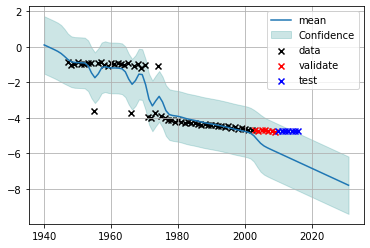

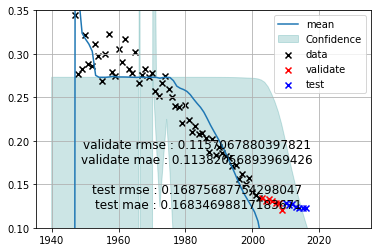

 10%|▉         | 126/1296 [10:26<3:16:31, 10.08s/it]

validate rmse : 0.1157067880397821 
 validate mae : 0.11382056893969426 

    test rmse : 0.16875687754298047 
 test mae : 0.16834698817183671
(('sa', 1), ('sal', 2), ('sal', 2), ('sa', 1))
params:[-1.11060114e-01  2.19295083e+02]


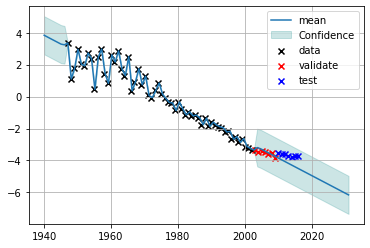

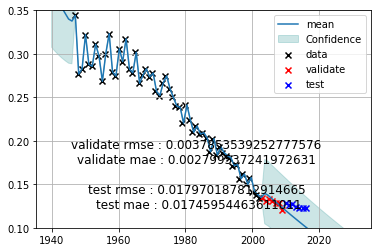

 10%|▉         | 127/1296 [10:43<3:58:35, 12.25s/it]

validate rmse : 0.0037853539252777576 
 validate mae : 0.002799537241972631 

    test rmse : 0.017970187812914665 
 test mae : 0.01745954463611011
(('sa', 1), ('sal', 2), ('sal', 2), ('sa', 2))
params:[-1.95044876e+01  3.87477944e+04]


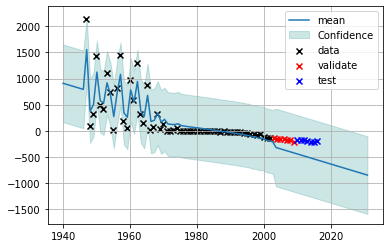

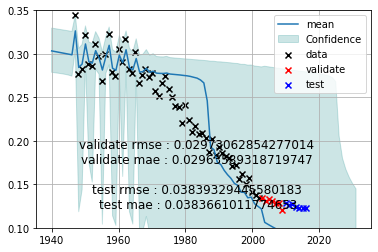

 10%|▉         | 128/1296 [10:56<4:03:20, 12.50s/it]

validate rmse : 0.02973062854277014 
 validate mae : 0.02963589318719747 

    test rmse : 0.03839329445580183 
 test mae : 0.0383661011774653
(('sa', 1), ('sal', 2), ('sal', 2), ('sal', 1))
params:[-1.12218371e-01  2.21602219e+02]


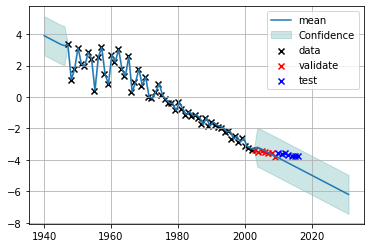

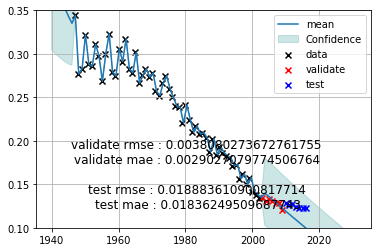

 10%|▉         | 129/1296 [11:15<4:39:34, 14.37s/it]

validate rmse : 0.0038080273672761755 
 validate mae : 0.0029027079774506764 

    test rmse : 0.018883610900817714 
 test mae : 0.01836249509687743
(('sa', 1), ('sal', 2), ('sal', 2), ('sal', 2))
params:[-1.11339670e-01  2.19837384e+02]


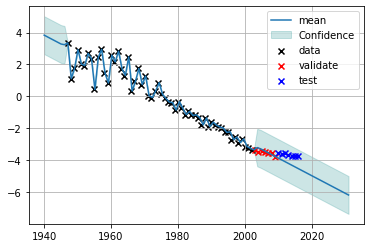

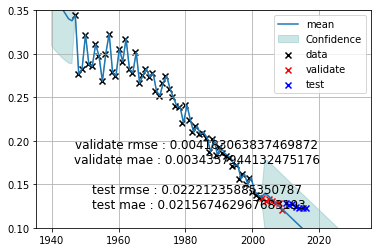

 10%|█         | 130/1296 [12:08<8:23:24, 25.90s/it]

validate rmse : 0.004183063837469872 
 validate mae : 0.0034357944132475176 

    test rmse : 0.02221235885350787 
 test mae : 0.021567462967683193
(('sa', 1), ('sal', 2), ('sal', 2), ('box_cox', 1))
params:[-3.99477913e+00  7.89001003e+03]


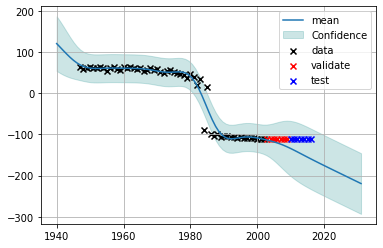

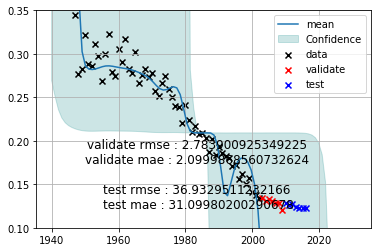

 10%|█         | 131/1296 [12:58<10:46:52, 33.32s/it]

validate rmse : 2.783900925349225 
 validate mae : 2.0999868560732624 

    test rmse : 36.9329511232166 
 test mae : 31.09980200290678
(('sa', 1), ('sal', 2), ('sal', 2), ('box_cox', 2))
params:[-1.08236473e-01  2.11570357e+02]


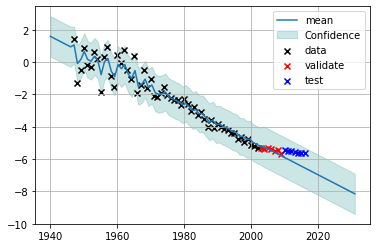

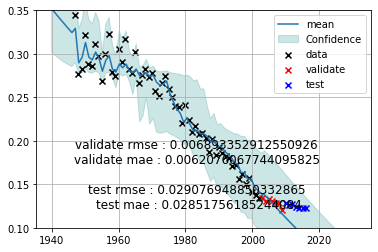

 10%|█         | 132/1296 [13:06<8:19:41, 25.76s/it] 

validate rmse : 0.006893352912550926 
 validate mae : 0.0062076067744095825 

    test rmse : 0.029076948850332865 
 test mae : 0.02851756185244084
(('sa', 1), ('sal', 2), ('box_cox', 1), ('sa', 1))
params:[-1.02553658e-01  2.01954933e+02]


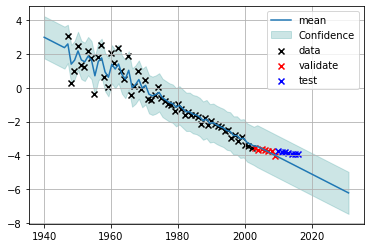

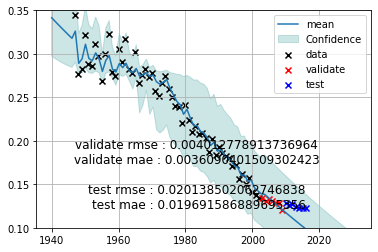

 10%|█         | 133/1296 [13:12<6:22:32, 19.74s/it]

validate rmse : 0.004012778913736964 
 validate mae : 0.0036090401509302423 

    test rmse : 0.020138502062746838 
 test mae : 0.019691586889695356
(('sa', 1), ('sal', 2), ('box_cox', 1), ('sa', 2))
params:[ 0.00040062 -0.29341741]


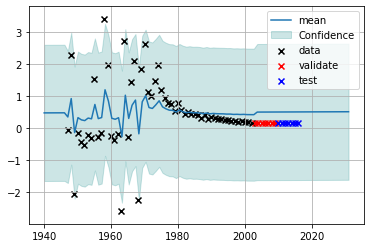

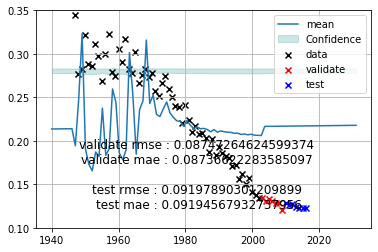

 10%|█         | 134/1296 [13:17<4:57:11, 15.35s/it]

validate rmse : 0.08747264624599374 
 validate mae : 0.08736622283585097 

    test rmse : 0.09197890301209899 
 test mae : 0.09194567932737956
(('sa', 1), ('sal', 2), ('box_cox', 1), ('sal', 1))
params:[-1.10019592e-01  2.17248577e+02]


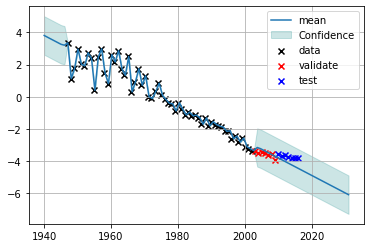

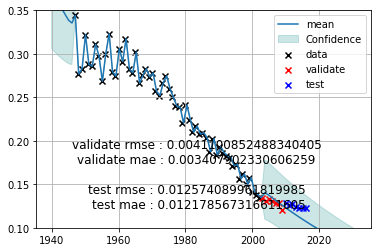

 10%|█         | 135/1296 [13:21<3:52:38, 12.02s/it]

validate rmse : 0.0041100852488340405 
 validate mae : 0.003407902330606259 

    test rmse : 0.012574089961819985 
 test mae : 0.012178567316611605
(('sa', 1), ('sal', 2), ('box_cox', 1), ('sal', 2))
params:[-1.41891646e+04  2.78960635e+07]


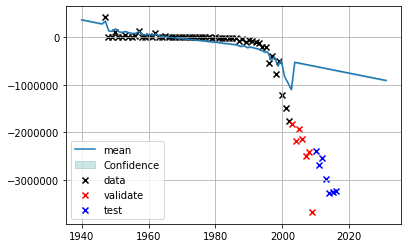

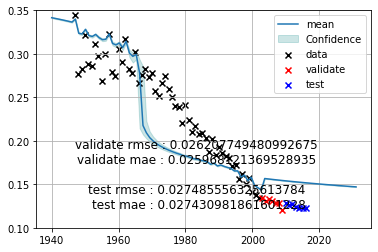

 10%|█         | 136/1296 [13:50<5:27:56, 16.96s/it]

validate rmse : 0.026207749480992675 
 validate mae : 0.025968121369528935 

    test rmse : 0.027485556325613784 
 test mae : 0.027430981861601228
(('sa', 1), ('sal', 2), ('box_cox', 1), ('box_cox', 1))
params:[-1.09306098e-01  2.13861151e+02]


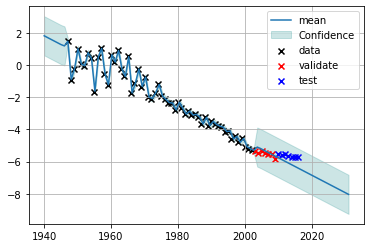

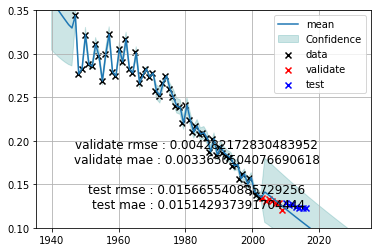

 11%|█         | 137/1296 [14:31<7:48:01, 24.23s/it]

validate rmse : 0.004282172830483952 
 validate mae : 0.0033650504076690618 

    test rmse : 0.015665540885729256 
 test mae : 0.015142937391704444
(('sa', 1), ('sal', 2), ('box_cox', 1), ('box_cox', 2))
params:[-1.03916994e-01  2.02113739e+02]


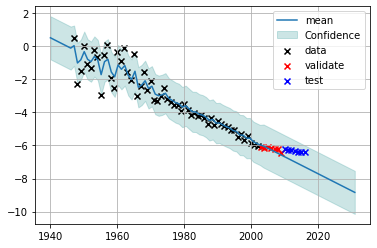

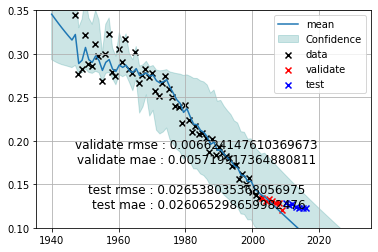

 11%|█         | 138/1296 [14:38<6:07:22, 19.03s/it]

validate rmse : 0.006624147610369673 
 validate mae : 0.005719917364880811 

    test rmse : 0.026538035368056975 
 test mae : 0.026065298659982476
(('sa', 1), ('sal', 2), ('box_cox', 2), ('sa', 1))
params:[-8.76651419e-02  1.71709264e+02]


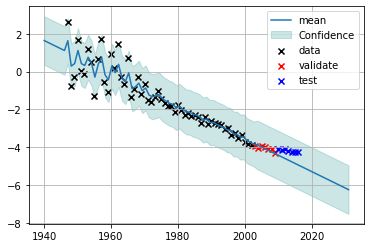

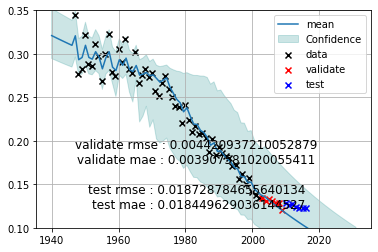

 11%|█         | 139/1296 [14:44<4:53:38, 15.23s/it]

validate rmse : 0.004420937210052879 
 validate mae : 0.003907581020055411 

    test rmse : 0.018728784655640134 
 test mae : 0.018449629036144527
(('sa', 1), ('sal', 2), ('box_cox', 2), ('sa', 2))
params:[-9.35215112e-02  1.83587863e+02]


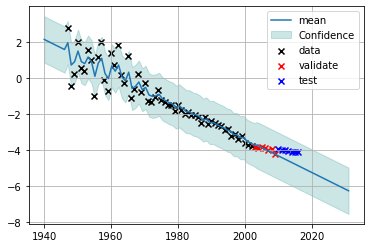

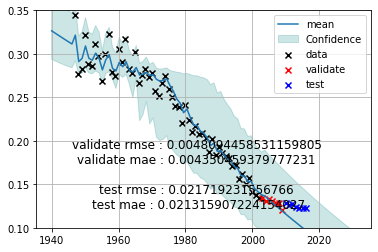

 11%|█         | 140/1296 [14:53<4:16:31, 13.31s/it]

validate rmse : 0.0048094458531159805 
 validate mae : 0.004350459379777231 

    test rmse : 0.021719231556766 
 test mae : 0.021315907224154027
(('sa', 1), ('sal', 2), ('box_cox', 2), ('sal', 1))
params:[-1.08708689e-01  2.14665998e+02]


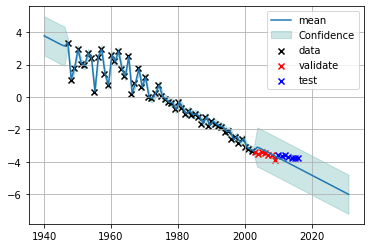

In [ ]:
result = grid_search(cwgp_regression, x_train, y_train, {"c":4,"n":[1,2],"transformations":["sa","sal","box_cox"]},
                    x_test=x_test,y_test=y_test,
                     func=poly, init_params=(1,-0.1)
                    )